# Running Model

Calibrated params from calibration_us_gdp.ipynb

In [1]:
# Import packages
import numpy as np
from abm_funs import *
from plot_funs import *
# from us_input import *
from copy import deepcopy 
from network_input_builder import *
import pandas as pd
import random as random
import matplotlib.pyplot as plt
from params_to_latex import *
from scipy.stats import truncnorm
from model_fun import *
from scipy.stats import pearsonr, linregress
import math as math
import importlib
from copy import deepcopy
from pandas import Series
import os
import seaborn as sns
import matplotlib.gridspec as gridspec
import datetime

from collate_macro_vars import *
from statsmodels.tsa.filters import hp_filter, bk_filter, cf_filter
from quantecon import hamilton_filter
from statsmodels.tsa.seasonal import seasonal_decompose
import csv

rng = np.random.default_rng()
test_fun()

path = "~/Documents/Documents - Nuff-Malham/GitHub/transition_abm/calibration_remote/"

import os
print(os.cpu_count())

save_button = False
suffix = ""
nw = "onet"
complete_nw = False
steady_state_run = False
strict_rw_spec = False
# if nw == "full_omn":
#     output_path = f'output/figures/'
#     which_params = nw
if not strict_rw_spec:
    print("running with relaxed RW")
    output_path = f'output/cos_calib/{nw}/figures/'
    which_params = f'cos_calib/{nw}/'
else:
    print("running with strict RW")
    which_params = f'cos_calib/{nw}/'
    output_path = f'output/cos_calib/{nw}/figures/'


if calib_date == ["2000-12-01", "2024-05-01"]:
    output_path = f'{output_path}/covid_oos/'



NEW Function import successful
12
running with relaxed RW


/Users/ebbamark/Documents/Documents - Nuff-Malham/GitHub/transition_abm/calibration_remote/collate_macro_vars.py:213: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['OBS_VALUE'] = hp_filter.hpfilter(subset['OBS_VALUE'], lamb=1600)[0]*.01+1


We draw the probability distribution of sending a particular binned value of applications from our work on the BLS Suppelement. We assume a uniform distribution within each bin setting a maximum application effort in the highest bin to 100 applications. 

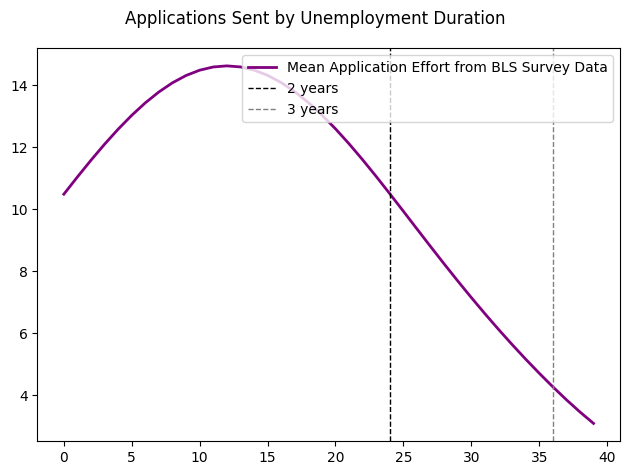

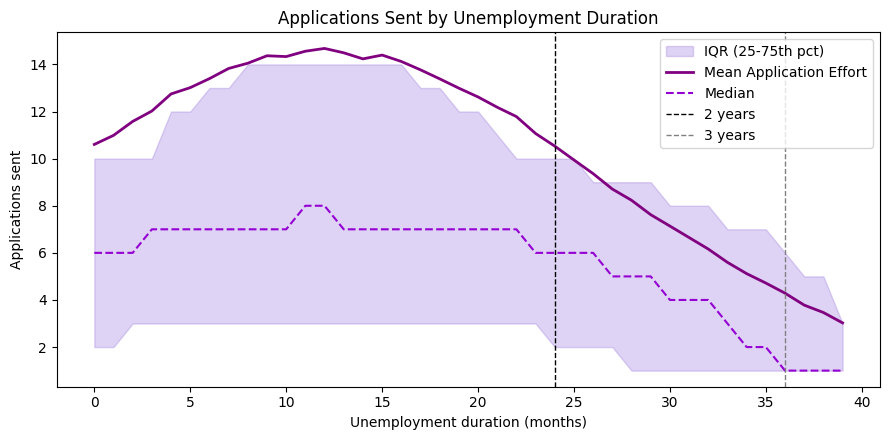

In [2]:
# series_dict = {}
# for i, a in enumerate([0.1, 0.05, 0.01]):
#     efforts = []
#     for t_unemp in range(36):
#         apps = search_effort_alpha(t_unemp, 1, True, a)
#         efforts.append(apps)

#     series_dict[f"Alpha: {a}"] = {
#         "x": list(range(0, len(efforts))),
#         "y": efforts
#         }

imposed_efforts = []
for t_unemp in range(40):
    apps = applications_sent(duration_months=t_unemp, duration_to_prob_dict=duration_to_prob_dict, expectation = True)
    imposed_efforts.append(apps)

bls_df = {
    "x": list(range(0, len(imposed_efforts))),
    "y": imposed_efforts
    }
   
plt.plot(bls_df['x'], bls_df['y'], color='purple', linestyle='-', linewidth=2, label='Mean Application Effort from BLS Survey Data')

plt.axvline(x=24, color='black', linestyle='--', linewidth=1, label='2 years')
plt.axvline(x=36, color='grey', linestyle='--', linewidth=1, label='3 years')
plt.legend(loc='upper right')
plt.suptitle("Applications Sent by Unemployment Duration")
plt.tight_layout()
plt.savefig('output/figures/applications_sent_by_unemployment_duration.png', dpi=300)
plt.show()


from collections import defaultdict

# --- parameters you can change ---
N = 50000                 # Monte-Carlo draws per duration (increase for smoother bands)
max_duration = 40        # number of months to plot
seed = 123               # reproducible sampling seed

random.seed(seed)
np.random.seed(seed)

# --- helper that runs N stochastic draws for a given duration ---
def sample_applications(duration, duration_to_prob_dict, n_draws=N):
    """Return an array of length n_draws of stochastic application counts for given duration."""
    samples = []
    for _ in range(n_draws):
        # call your function in stochastic mode (expectation=False)
        # ensure it returns an integer >= 1 as your original did
        samples.append(applications_sent(duration, duration_to_prob_dict, expectation=False))
    return np.array(samples, dtype=float)

# --- run MC across durations and compute summary stats ---
durations = list(range(max_duration))
means = []
medians = []
p05 = []
p25 = []
p75 = []
p95 = []

for t in durations:
    # if duration missing in dict, your function returns 1; still sample
    arr = sample_applications(t, duration_to_prob_dict, n_draws=N)
    means.append(arr.mean())
    medians.append(np.median(arr))
    p05.append(np.percentile(arr, 5))
    p25.append(np.percentile(arr, 25))
    p75.append(np.percentile(arr, 75))
    p95.append(np.percentile(arr, 95))

means = np.array(means)
medians = np.array(medians)
p05 = np.array(p05)
p25 = np.array(p25)
p75 = np.array(p75)
p95 = np.array(p95)

# --- plotting ---
plt.figure(figsize=(9, 4.5))

# shaded 90% band (5th to 95th percentile)
#plt.fill_between(durations, p05, p95, color='lavender', alpha=0.6, label='90% interval (5-95th pct)')

# shaded interquartile band
plt.fill_between(durations, p25, p75, color='mediumpurple', alpha=0.3, label='IQR (25-75th pct)')

# mean and median lines
plt.plot(durations, means, color='purple', linestyle='-', linewidth=2, label='Mean Application Effort')
plt.plot(durations, medians, color='darkviolet', linestyle='--', linewidth=1.5, label='Median')

# vertical reference lines
plt.axvline(x=24, color='black', linestyle='--', linewidth=1, label='2 years')
plt.axvline(x=36, color='grey', linestyle='--', linewidth=1, label='3 years')

plt.legend(loc='upper right')
plt.title("Applications Sent by Unemployment Duration")
plt.xlabel("Unemployment duration (months)")
plt.ylabel("Applications sent")
plt.tight_layout()
plt.savefig('output/figures/applications_sent_by_unemployment_duration_with_uncertainty.png', dpi=300)
plt.show()



#### Mobility Networks

In [3]:
# Load US_input data
#A2 = pd.read_csv(path + "dRC_Replication/data/occupational_mobility_network.csv", header=None)
#A2 = pd.read_csv(path + "dRC_Replication/omn_asec_11_19_occ_alltransitions_connected_comp.csv", header=None)
#A = pd.read_csv("/Users/ebbamark/OneDrive - Nexus365/GenerateOccMobNets/data/omn_asec_11_19_occ_matched_plus_oldtransitions_2025_normalised.csv", delimiter=",", header = None)

# plt.imshow(np.sqrt(A), cmap='Greys', interpolation='none')
# plt.title("New Matrix")
# plt.show()
# plt.imshow(np.sqrt(A2), cmap='Greys', interpolation='none')
# plt.title("Old Matrix")
# plt.show()

# # print(A2)
# # --- Basic shape check ---
# f"Shape mismatch: {A.shape} vs {A2.shape}"

# # --- Compute simple difference metrics ---
# diff = A2 - A
# absdiff = np.abs(diff)

# print("Mean absolute difference:", np.mean(absdiff))
# print("Root mean squared difference:", np.sqrt(np.mean(diff**2)))
# print("Max absolute difference:", np.max(absdiff))
# print("Min/Max A (new matrix):", np.min(A), np.max(A))
# print("Min/Max A2 (old matrix):", np.min(A2), np.max(A2))


# # --- Visualize differences ---
# plt.figure(figsize=(6,5))
# plt.imshow(diff, cmap="bwr", vmin=-np.max(absdiff), vmax=np.max(absdiff))
# plt.title("Difference (A2 (old matrix) - A (new matrix))")
# plt.colorbar(label="Change in transition probability")
# plt.show()

# # --- Scatter plot of all entries ---
# plt.figure(figsize=(5,5))
# plt.scatter(np.array(A).flatten(), np.array(A2).flatten(), alpha=0.3)
# plt.xlabel("New matrix (A)")
# plt.ylabel("Old matrix (A2)")
# plt.title("Element-wise comparison")
# plt.plot([0,1],[0,1],"k--",alpha=0.5)
# plt.show()

# # --- Histogram of absolute differences ---
# plt.figure(figsize=(6,4))
# plt.hist(np.array(absdiff).flatten(), bins=100, color='gray')
# plt.title("Distribution of absolute differences")
# plt.xlabel("|A2 (old matrix) - A (new matrix)|")
# plt.ylabel("Count")
# plt.show()

## Data Inputs

### Unemployed Search Effort Time Series

In [4]:

# Macro observations
observation = macro_observations.loc[
    (macro_observations['DATE'] >= calib_date[0]) & 
    (macro_observations['DATE'] <= calib_date[1])].dropna(subset=["UNRATE", "VACRATE"]).reset_index()

mod_data, net_temp, vacs, occ_ids, occ_shocks_dat = network_input_builder(nw, complete_nw, calib_date)
# if nw == "single_node":
#     which_params = "omn_soc_minor"
# Load calibrated parameters from CSV
#param_df1 = pd.read_csv(path + f"output/full_omn/calibrated_params_all{suffix}.csv")
#param_df2 = pd.read_csv(path + f"output/full_omn/calibrated_params_all_theta_signal{suffix}.csv")

param_df1 = pd.read_csv(path + f"output/{which_params}calibrated_params_all{suffix}.csv")
print(f"output/{which_params}/calibrated_params_all{suffix}.csv")
param_df2 = pd.read_csv(path + f"output/{which_params}calibrated_params_all_theta_signal{suffix}.csv")
print(f"output/{which_params}/calibrated_params_all_theta_signal{suffix}.csv")
param_df = pd.concat([param_df1, param_df2], ignore_index=True)

print(param_df1.shape, param_df2.shape, param_df.shape)

# Sort by Timestamp in descending order
param_df = param_df.sort_values(by='Timestamp', ascending=False)

# if nw == "single_node":
#     which_params = "single_node"
    
name_map = {
    "nonbehav": "Non-behavioural",
    "otj_nonbehav": "Non-behavioural w. OTJ",
    "otj_cyclical_e_disc": "Behavioural w. Cyc. OTJ w. RW",
    "otj_disc": "Behavioural w.o. Cyc. OTJ w. RW",
    "otj_cyclical_e_disc_no_rw": "Behavioural w. Cyc. OTJ w.o RW",
    "otj_disc_no_rw": "Behavioural w.o. Cyc. OTJ w.o RW",
}

desired_order = [
    "Non-behavioural",
    "Non-behavioural w. OTJ",
    "Behavioural w. Cyc. OTJ w. RW",
    "Behavioural w.o. Cyc. OTJ w. RW",
    "Behavioural w. Cyc. OTJ w.o RW",
    "Behavioural w.o. Cyc. OTJ w.o RW",
]


params_to_latex(
    param_df,
    out_tex_path=f"output/{which_params}/figures/params_table.tex",
    param_col="Parameter",
    value_col="Value",
    model_col="model_cat",
    timestamp_col="Timestamp",
    model_name_map=name_map,
    desired_model_order=desired_order,
    decimals=3
)

print(param_df)

params = {
    'mod_data': mod_data,
    'net_temp': net_temp,
    'vacs': vacs,
    'time_steps': len(gdp_dat),
    'delay': 0,
    'gdp_data': gdp_dat,
    'app_effort_dat': duration_to_prob_dict,
    'occ_shocks_data': occ_shocks_dat,
    'simple_res': False,
    'dumb_hire': True,
    'mistake_rate': 0.1
}

# Shorten vac_df to the same length as gdp_dat using a moving average (if needed)
vac_df = observation['VACRATE'].to_numpy()
if len(vac_df) > len(gdp_dat):
    print("smoothing vac_df")
    # Apply moving average with window to smooth and match length
    window = len(vac_df) // len(gdp_dat)
    vac_dat = Series(vac_df).rolling(window=window, min_periods=1).mean()[window-1::window].reset_index(drop=True)
    vac_dat = vac_dat[:len(gdp_dat)]
else:
    vac_dat = vac_df[:len(gdp_dat)]

print(param_df)

Using ONET Related Occupations Network
Build mod_data.
Nodes (n): 516
Initialised network.
output/cos_calib/onet//calibrated_params_all.csv
output/cos_calib/onet//calibrated_params_all_theta_signal.csv
(30, 8) (21, 8) (51, 8)
Wrote LaTeX table to output/cos_calib/onet//figures/params_table.tex
   Parameter     Value    otj  cyc_otj  cyc_ue   disc           Timestamp  \
50     theta  0.454795   True     True   False   True 2025-12-23 21:46:17   
49   gamma_u  0.113353   True     True   False   True 2025-12-23 21:46:17   
48       d_u  0.007214   True     True   False   True 2025-12-23 21:46:17   
47     theta  0.149160   True     True   False   True 2025-12-23 21:24:19   
46   gamma_u  0.773436   True     True   False   True 2025-12-23 21:24:19   
45       d_u  0.015450   True     True   False   True 2025-12-23 21:24:19   
44     theta  0.110535   True     True   False   True 2025-12-23 15:55:59   
43   gamma_u  0.683151   True     True   False   True 2025-12-23 15:55:59   
42       d_u

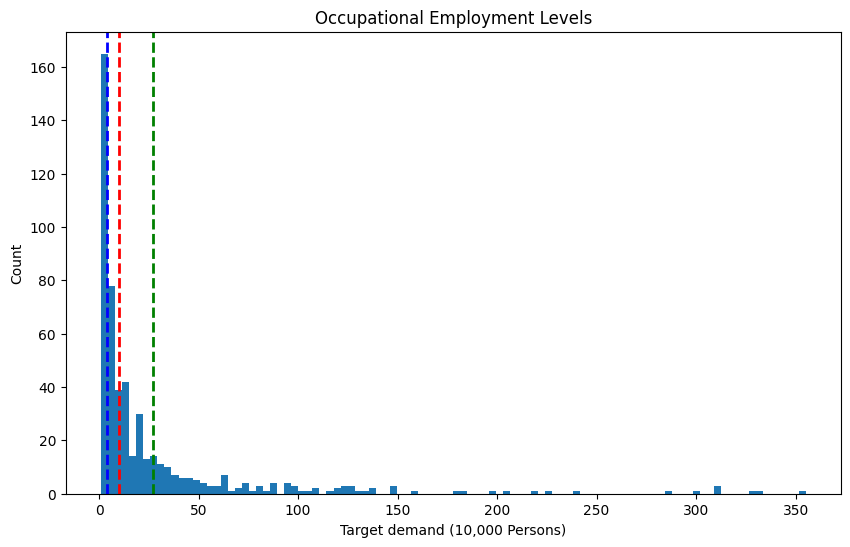

In [5]:
# # Prepare DataFrame for correlation analysis
# mod_data_df = pd.DataFrame({
#     'Employment': mod_data['employment'],
#     'Unmployment': mod_data['unemployment'],
#     #'Target Demand':demand_target['IPUMS_CPS_av_monthly_employment_whole_period'],
#     'Wages': mod_data['wages']['median_earnings'],
#     'Gender Share': mod_data['gend_share']['women_pct'],
#     'Entry Level': mod_data['entry_level'],
#     'Experience Age': mod_data['experience_age'],
#     'Separation Rates': mod_data['separation_rates'],
#     #'Education Requirements': mod_data['ed_req'],
#     #'Experience Requirements': mod_data['experience_req'],
#     #'Entry Age': experience_req['entry_age'],
#     'Experience Age': mod_data['experience_age']
# })


# # # Map education requirements to ordinal values
# # edu_order = [
# #     'No formal educational credential',
# #     'High school diploma or equivalent',
# #     'Some college, no degree',
# #     'Postsecondary nondegree award',
# #     "Associate's degree",
# #     "Bachelor's degree",
# #     "Master's degree",
# #     'Doctoral or professional degree'
# # ]

# experience_order = [
#     np.nan,
#     "Less than 5 years",
#     "5 years or more"
# ]
# edu_map = {name: i for i, name in enumerate(edu_order)}
# mod_data_df['Education Requirements Ordinal'] = mod_data_df['Education Requirements'].map(edu_map)

# experience_map = {name: i for i, name in enumerate(experience_order)}
# mod_data_df['Experience Requirements Ordinal'] = mod_data_df['Experience Requirements'].map(experience_map)
# # Calculate correlations between Separation Rates and other variables
# corrs = mod_data_df.drop(columns=['Education Requirements', 'Experience Requirements']).corr()
# sep_corrs = corrs['Separation Rates'].drop('Separation Rates')

# # Sort correlations by absolute value (or just value)
# sep_corrs_sorted = sep_corrs.sort_values()

# # Plot correlation coefficients as a bar plot
# plt.figure(figsize=(10, 6))
# bars = plt.barh(sep_corrs_sorted.index, sep_corrs_sorted.values, color='magenta', alpha=0.3)
# plt.xlabel('Correlation with Separation Rates')
# plt.title('Correlation of Separation Rates with Occupational Characteristics')


# # Scatterplots of separation_rates vs each other variable in a 3x3 grid
# # Exclude specific columns from scatterplots
# exclude_cols = ['Education Requirements', 'Experience Requirements', 'Separation Rates']
# other_cols = [col for col in mod_data_df.columns if col not in exclude_cols]
# fig, axes = plt.subplots(3, 3, figsize=(15, 12))
# axes = axes.flatten()

# for i, col in enumerate(other_cols):
#     ax = axes[i]
#     sns.scatterplot(x=mod_data_df[col], y=mod_data_df['Separation Rates'], color="purple", ax=ax)
#     ax.set_ylabel('Separation Rates')
#     ax.set_title(f'Separation Rates vs {col}')
#     # Custom x-tick labels for ordinal columns
#     if col == 'Education Requirements Ordinal':
#         ax.set_xticks(range(len(edu_order)))
#         ax.set_xticklabels(edu_order, rotation=45, ha='right', fontsize=8)
#         ax.set_xlabel('Education Requirements')
#     elif col == 'Experience Requirements Ordinal':
#         ax.set_xticks(range(len(experience_order)))
#         ax.set_xticklabels([str(x) if pd.isna(x) else x for x in experience_order], rotation=45, ha='right', fontsize=8)
#         ax.set_xlabel('Experience Requirements')
#     else:
#         ax.set_xlabel(col)

# # Hide any unused subplots
# for j in range(len(other_cols), len(axes)):
#     fig.delaxes(axes[j])

# plt.tight_layout()
# plt.show()

plt.figure(figsize=(10, 6))
plt.hist(mod_data['demand_target'], bins = 100)
#plt.hist(mod_data['employment'], bins = 100)
# plt.figure(figsize=(10, 6)
# Add percentile vertical lines
plt.axvline(np.percentile(mod_data['demand_target'], 25), color='blue', linestyle='--', linewidth=2, label='25th percentile')
plt.axvline(np.percentile(mod_data['demand_target'], 50), color='red', linestyle='--', linewidth=2, label='Median (50th)')
plt.axvline(np.percentile(mod_data['demand_target'], 75), color='green', linestyle='--', linewidth=2, label='75th percentile')
plt.title("Occupational Employment Levels")
plt.ylabel("Count")
plt.xlabel("Target demand (10,000 Persons)")
plt.show()



## Model List

In [6]:
calib_list = {
    "nonbehav": {"otj": False, # has been run
                           "cyc_otj": False, 
                           "cyc_ue": False, 
                           "disc": False,
                           "delay": 25,
                           "bus_confidence_dat": gdp_dat,
                           "emp_apps": 1,
                           'wage_prefs': False,
                           'vac_data': vac_dat,
                           'strict_rw': strict_rw_spec},
              "otj_nonbehav": {"otj": True, # has been run
                           "cyc_otj": False, 
                           "cyc_ue": False, 
                           "disc": False, 
                           "delay": 25,
                          'wage_prefs': False,
                           'emp_apps': 1,
                           "bus_confidence_dat": gdp_dat,
                            "vac_data": vac_dat,
                            'strict_rw': strict_rw_spec},
            "otj_cyclical_e_disc": {"otj": True,
                           "cyc_otj": True, 
                           "cyc_ue": False, 
                           "disc": True,
                           "delay": 25,
                           'emp_apps': 1,
                           'wage_prefs': True,
                           "bus_confidence_dat": gdp_dat,
                           "vac_data": vac_dat,
                           'strict_rw': strict_rw_spec},
             "otj_cyclical_e_disc_no_rw": {"otj": True,
                           "cyc_otj": True, 
                           "cyc_ue": False, 
                           "disc": True,
                           "delay": 25,
                           'wage_prefs': False,
                           'emp_apps': 1,
                           "bus_confidence_dat": gdp_dat,
                           "vac_data": vac_dat,
                           'strict_rw': strict_rw_spec},
            "otj_disc": {"otj": True,
                          "cyc_otj": False, 
                          "cyc_ue": False, 
                          "disc": True,
                          "delay": 25,
                          'emp_apps': 1,
                          'wage_prefs': True,
                          "bus_confidence_dat": gdp_dat,
                          "vac_data": vac_dat,
                          'strict_rw': strict_rw_spec},
            "otj_disc_no_rw": {"otj": True,
                          "cyc_otj": False, 
                          "cyc_ue": False, 
                          "disc": True,
                          "delay": 25,
                          "wage_prefs": False,
                          'emp_apps': 1,
                          "bus_confidence_dat": gdp_dat,
                          "vac_data": vac_dat,
                          'strict_rw': strict_rw_spec}
            }


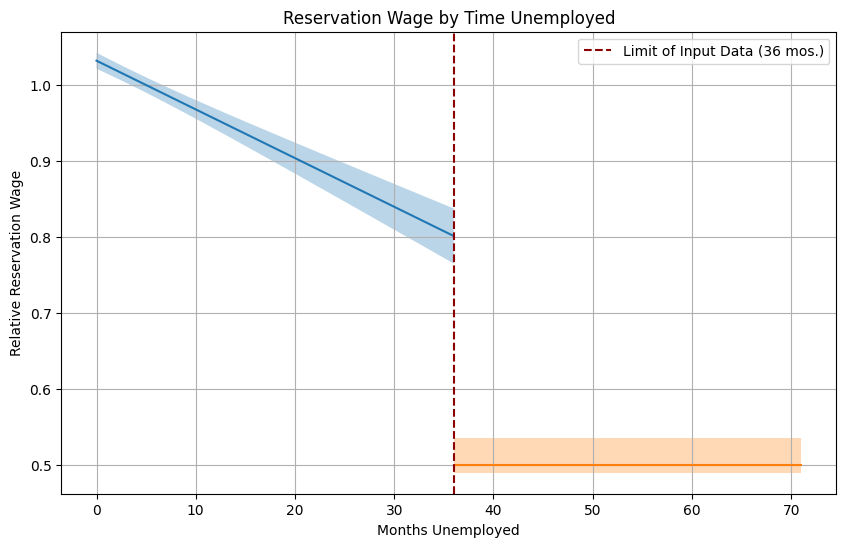

In [7]:
t_unemp = np.arange(0, 50)

def res_search_and_apply(wrkr_time_unemployed, wage_prefs): 
    if wage_prefs:
        if wrkr_time_unemployed > 3:
            res_wage = (1 - 0.1 * (wrkr_time_unemployed - 3))
        else:
            res_wage = 1

    return res_wage

# plt.figure(figsize=(10, 6))
# res_wages = [res_search_and_apply(t, True) for t in t_unemp]
# res_wages_data_driven = [reservation_wage(t, res_wage_dat, expectation= True) for t in t_unemp]
# #plt.plot(t_unemp, res_wages, label=f'Fixed')
# plt.plot(t_unemp, res_wages_data_driven, label='Data Driven')

# plt.xlabel('Months Unemployed')
# plt.ylabel('Relative Reservation Wage')
# plt.title('Reservation Wage by Time Unemployed')
# plt.legend()
# plt.grid(True)
# plt.show()

extra_t = 36
extra_ts = range(np.max(res_wage_dat['dur_unemp']), np.max(res_wage_dat['dur_unemp']) + extra_t)

plt.figure(figsize=(10, 6))
plt.plot(res_wage_dat['dur_unemp'], res_wage_dat['lm_preds_fit'])
plt.fill_between(res_wage_dat['dur_unemp'], res_wage_dat['lm_preds_fit'] + res_wage_dat['lm_se'], res_wage_dat['lm_preds_fit'] - res_wage_dat['lm_se'], alpha = 0.3)
plt.plot(extra_ts, np.repeat(0.5, len(extra_ts)))
plt.fill_between(extra_ts, np.repeat(0.5, len(extra_ts)) + np.max(res_wage_dat['lm_se']), np.repeat(0.5, len(extra_ts)) - np.min(res_wage_dat['lm_se']), alpha = 0.3)
plt.axvline(x = 36, color = "darkred", linestyle = "dashed", label = "Limit of Input Data (36 mos.)")

plt.xlabel('Months Unemployed')
plt.ylabel('Relative Reservation Wage')
plt.title('Reservation Wage by Time Unemployed')
plt.legend()
plt.grid(True)
plt.show()

## Model Run

In [8]:
# Initialize the results dictionaries
model_results = {}
net_results = {}
sim_results = {}
sum_stats_list = {}
seekers_recs_list = {}
avg_wage_off_diffs = {}
app_loads = {}
time_to_emps = {}
vacs_finals = {}

print(param_df)
# Loop through each model configuration
for name, item in calib_list.items():
    # Create a deep copy of the base parameters
    print(name)
    test_params = deepcopy(params)

    # Update with values from param_df specific to the current model name
    # if name in param_df['model_cat'].values:
    #     param_updates = param_df[param_df['model_cat'] == name].set_index('Parameter')['Value'].to_dict()
    #     print(param_updates)
    #     test_params.update(param_updates)
    # if name in ['otj_nonbehav', 'nonbehav']:

    #     param_df_new = pd.read_csv(f'{path}output/{which_params}grid_search_results_{name}.csv')
    # else:
    #     grid_results = pd.read_csv(f'{path}output/grid_search_results_{name}.csv')
    #     param_df_new = grid_results[grid_results['timestamp'] > '2025-09-05']
    # Sort by Timestamp in descending order
    #param_df_new = param_df_new.sort_values(by='distance', ascending=True).reset_index(drop=True)

    if 'cyclical_e' in name:
        calib_params = {'gamma_u': param_df.loc[(param_df['model_cat'] == name) & (param_df["Parameter"] == "gamma_u"),"Value"].iloc[0],
                    'd_u': param_df.loc[(param_df['model_cat'] == name) & (param_df["Parameter"] == "d_u"),"Value"].iloc[0],
                    'theta': param_df.loc[(param_df['model_cat'] == name) & (param_df["Parameter"] == "theta"),"Value"].iloc[0],
                    'd_v':0.01,
                    'gamma_v':0.16}
    else:
        calib_params = {'gamma_u': param_df.loc[(param_df['model_cat'] == name) & (param_df["Parameter"] == "gamma_u"),"Value"].iloc[0],
                    'd_u': param_df.loc[(param_df['model_cat'] == name) & (param_df["Parameter"] == "d_u"),"Value"].iloc[0],
                    'theta': None, 
                    'd_v':0.01,
                    'gamma_v':0.16}
    # calib_params = {
    #     'd_u': param_df_new['d_u'][0], # 0.02, 
    #     'gamma_u': param_df_new['gamma_u'][0] #0 # 
    # }
    print(calib_params)
    test_params.update(calib_params)

    # Update with the values from the calib_list
    test_params.update(item)
    if steady_state_run:
        test_params.update({"steady_state": True,
                            "time_steps": 1000,
                            "delay": 0})
    else:
        test_params.update({"steady_state": False})

    # Run the model
    sim_record, sim_grouped, sim_net, sum_stats, seekers_rec, avg_wage_off_diff, app_loads_df, time_to_emp, vacs_final = run_single_local(**test_params)

    # Generate plots or metrics (optional step)
    #ue_vac = plot_records(sim_record, calib_date[0], calib_date[1])
    sim_grouped['DATE'] = pd.date_range(start=calib_date[0], end= calib_date[1], periods=len(sim_grouped))
    sim_grouped['LTUER'] = sim_grouped['LT Unemployed Persons'] / sim_grouped['Unemployment']
    sim_grouped['AVGWAGE'] = sim_grouped['Total_Wages'] / sim_grouped['Employment']
    sim_grouped["Seeker Composition"] = sim_grouped["Employed Seekers"] / (sim_grouped["Employed Seekers"] + sim_grouped["Unemployed Seekers"])
    sim_record['LTUER'] = sim_record['LT Unemployed Persons'] / sim_record['Unemployment']
    sim_record['UER'] = sim_record['Unemployment'] / sim_record['Workers']
    sim_record['AVGWAGE'] = sim_record['Total_Wages'] / sim_record['Employment']
    sim_record['VACRATE1'] = sim_record['Vacancies'] / sim_record['Target_Demand']
    sim_record['VACRATE'] = sim_record['Vacancies'] / (sim_record['Vacancies'] + sim_record['Employment'])
    sim_record['U_REL_WAGE_MEAN'] = sim_record['U_Rel_Wage'] / sim_record['UE_Transitions']
    sim_record['E_REL_WAGE_MEAN'] = sim_record['E_Rel_Wage'] / sim_record['EE_Transitions']
    sim_record['UE_Trans_Rate'] = sim_record['UE_Transitions'] / sim_record['Workers']
    sim_record['EE_Trans_Rate'] = sim_record['EE_Transitions'] / sim_record['Workers']
    sim_record = sim_record.merge(occ_ids, left_on='Occupation', right_on="id", how='left')

    seekers_rec['DATE'] = pd.date_range(start=calib_date[0], end= calib_date[1], periods=len(seekers_rec))
    seekers_rec['Application Effort (U)'] = seekers_rec['Applications Sent (Unemployed)'] / seekers_rec['Unemployed Seekers']
    seekers_rec['Application Effort (E)'] = seekers_rec['Applications Sent (Employed)'] / seekers_rec['Employed Seekers']

    # Store the results
    model_results[name] = sim_grouped
    sim_results[name] = sim_record
    net_results[name] = sim_net
    sum_stats_list[name] = sum_stats
    seekers_recs_list[name] = seekers_rec
    avg_wage_off_diffs[name] = avg_wage_off_diff
    app_loads[name] = app_loads_df
    time_to_emps[name] = time_to_emp
    vacs_finals[name] = vacs_final

   Parameter     Value    otj  cyc_otj  cyc_ue   disc           Timestamp  \
50     theta  0.454795   True     True   False   True 2025-12-23 21:46:17   
49   gamma_u  0.113353   True     True   False   True 2025-12-23 21:46:17   
48       d_u  0.007214   True     True   False   True 2025-12-23 21:46:17   
47     theta  0.149160   True     True   False   True 2025-12-23 21:24:19   
46   gamma_u  0.773436   True     True   False   True 2025-12-23 21:24:19   
45       d_u  0.015450   True     True   False   True 2025-12-23 21:24:19   
44     theta  0.110535   True     True   False   True 2025-12-23 15:55:59   
43   gamma_u  0.683151   True     True   False   True 2025-12-23 15:55:59   
42       d_u  0.015505   True     True   False   True 2025-12-23 15:55:59   
29   gamma_u  0.032915   True    False   False   True 2025-12-22 13:03:10   
28       d_u  0.012438   True    False   False   True 2025-12-22 13:03:10   
27   gamma_u  0.600110   True    False   False   True 2025-12-22 04:04:41   

In [9]:
# import pyabc
# db_path_otj_disc = os.path.join(f"output/{which_params}pyabc_runs/otj_disc.db")
# history = pyabc.History("sqlite:///" + db_path_otj_disc, create=False)

# t_final = history.max_t
# df_final, w_final = history.get_distribution(t=t_final)
# new_params = {
#             "d_u": np.sum(df_final["d_u"] * w_final),
#             "gamma_u": np.sum(df_final["gamma_u"] * w_final)
#         }

# model_cat = "otj_disc"

# # Save parameter estimates to CSV
# csv_filename = os.path.expanduser(path + f"output/pyabc/calibrated_params_all_new.csv")
# if not os.path.exists(csv_filename):
#         with open(csv_filename, "w", newline="") as file:
#             writer = csv.writer(file)
#             writer.writerow(["Parameter", "Value", "otj", "cyc_otj", "cyc_ue", "disc", "Timestamp","model_cat"])

# with open(csv_filename, "a", newline="") as file:
#     writer = csv.writer(file)
#     for param, value in new_params.items():
#         writer.writerow([param, value, True, False, False, True, datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"),name])


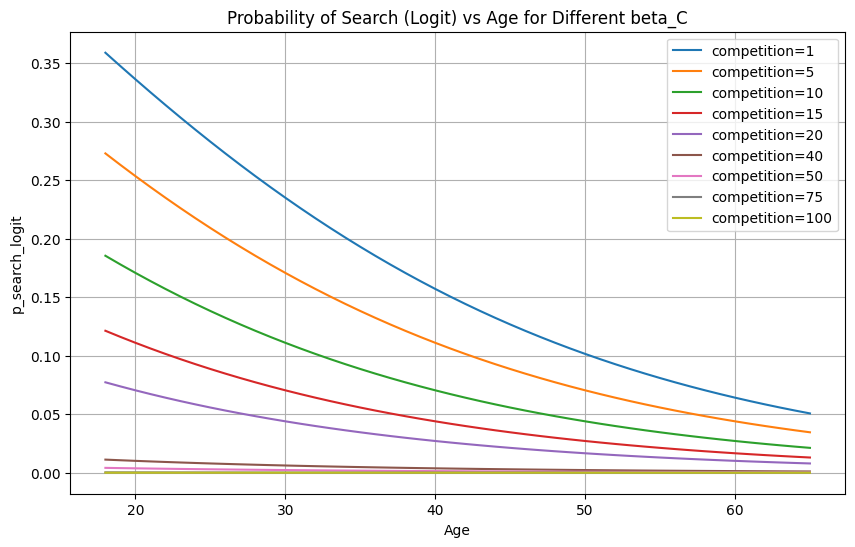

In [10]:
ages = np.arange(18, 66)
comp_values = [1,5,10,15,20,40,50,75,100]  # fixed competition value - 20 applications per vacancy


plt.figure(figsize=(10, 6))
for C in comp_values:
    p_vals = [ p_search_logit(
                            age,
                            # Taken from calculated competition metric for occupation
                            comp=C,
                            alpha=-1.58,     # tune baseline
                            beta_A=-0.05,  # age effect
                            beta_C=0.1,    # competition effect
                            A0=40.0
                        ) for age in ages]
    plt.plot(ages, p_vals, label=f'competition={C}')

plt.xlabel('Age')
plt.ylabel('p_search_logit')
plt.title('Probability of Search (Logit) vs Age for Different beta_C')
plt.legend()
plt.grid(True)
plt.show()

In [11]:
# --- Apply plot labels to models ---
name_map = {
    "nonbehav": "Non-behavioural",
    "otj_nonbehav": "Non-behavioural w. OTJ",
    "otj_cyclical_e_disc": "Behavioural w. Cyc. OTJ w. RW",
    "otj_disc": "Behavioural w.o. Cyc. OTJ w. RW",
    "otj_cyclical_e_disc_no_rw": "Behavioural w. Cyc. OTJ w.o RW",
    "otj_disc_no_rw": "Behavioural w.o. Cyc. OTJ w.o RW",
}
desired_order = list(name_map.keys())

def filter_and_relabel(d, mapping, order):
    return {mapping[k]: d[k] for k in order if k in d}

filtered_model_results = filter_and_relabel(model_results, name_map, desired_order)
filtered_net_results   = filter_and_relabel(net_results,   name_map, desired_order)
filtered_sim_results   = filter_and_relabel(sim_results,   name_map, desired_order)
filtered_sum_stats     = filter_and_relabel(sum_stats_list, name_map, desired_order)
seekers_recs    = filter_and_relabel(seekers_recs_list, name_map, desired_order)
filtered_app_loads    = filter_and_relabel(app_loads, name_map, desired_order)
filtered_time_to_emps = filter_and_relabel(time_to_emps, name_map, desired_order)

# test_params.update({'simple_res':True})
# test_seps_rate = run_single_local(**test_params)

# palette & colors
palette = sns.color_palette("Paired", 12)

blues      = palette[0:2]
greens     = palette[2:4]
reds       = palette[4:6]
oranges    = palette[6:8]
purples    = palette[8:10]
yellows    = palette[10:12]
print(name_map.values())

my_colors = blues + purples + oranges
plot_colors = dict(zip(name_map.values(), my_colors))


dict_values(['Non-behavioural', 'Non-behavioural w. OTJ', 'Behavioural w. Cyc. OTJ w. RW', 'Behavioural w.o. Cyc. OTJ w. RW', 'Behavioural w. Cyc. OTJ w.o RW', 'Behavioural w.o. Cyc. OTJ w.o RW'])


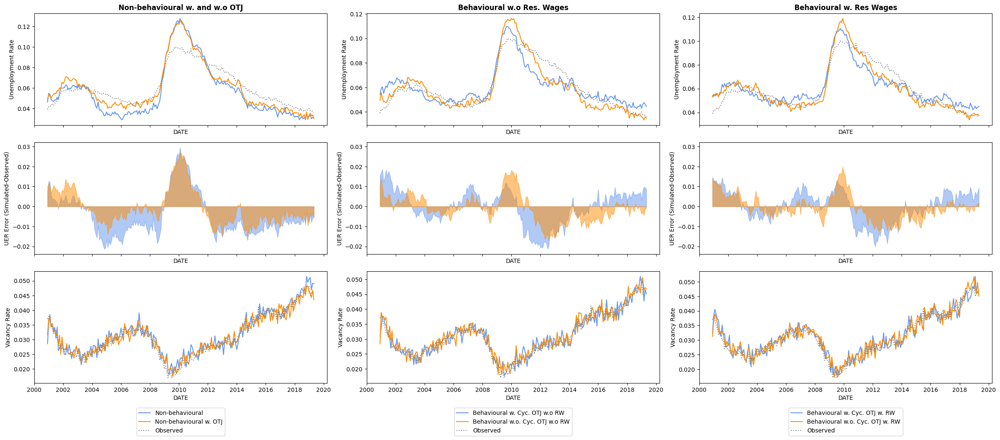

In [12]:
plot_uer_vac(filtered_model_results, observation, 
           sep_strings=[("Non-behavioural", "Non-behavioural w. and w.o OTJ"), 
                        ("w.o RW", "Behavioural w.o Res. Wages"),
                        ("w. RW", "Behavioural w. Res Wages")], 
             sep=True, save=save_button, path=output_path, free_date_scale=steady_state_run, calib_date = calib_date)

In [13]:
print(f"vac_data range: min={vac_dat.min():.4f}, max={vac_dat.max():.4f}, mean={vac_dat.mean():.4f}")

vac_data range: min=0.0170, max=0.0480, mean=0.0309


5
[5, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

/var/folders/8b/bf75_lhn2ks3ff8jvrhctcvc0000gr/T/ipykernel_8769/1486999990.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


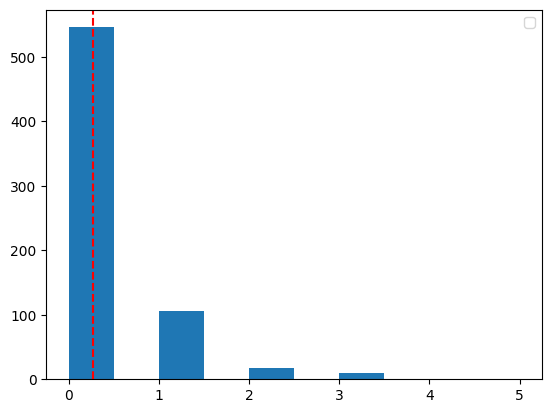

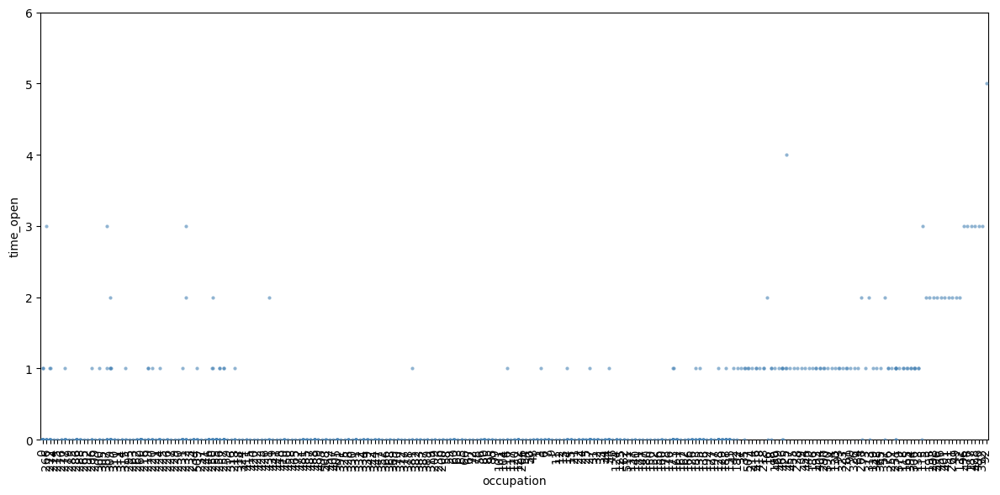

In [14]:
time_opens = [job.time_open for job in vacs_finals['otj_disc']]

print(vacs_finals['otj_disc'][0].time_open)
print(time_opens)
plt.hist(time_opens)
plt.axvline(np.mean(time_opens), color='red', linestyle='--')#, label=f"Mean = {mean_wage:.2f}")
plt.legend()
plt.show()

# Build a DataFrame from your objects
df = pd.DataFrame([
    {"occupation": job.occupation_id, "time_open": job.time_open}
    for job in vacs_finals["otj_disc"]
])

# plt.figure(figsize=(12,6))
# sns.violinplot(data=df, x="occupation", y="time_open", inner="quartile")
# plt.xticks(rotation=90)
# plt.title("Distribution of time_open by Occupation")
# plt.tight_layout()
# plt.show()

order = df.groupby("occupation")["time_open"].median().sort_values().index

plt.figure(figsize=(12, 6))
sns.stripplot(    data=df,
    x="occupation",
    y="time_open",
    order=order,
    jitter=True,            # jitter to avoid vertical overlaps
    alpha=0.6,
    size=3,
    color="steelblue")
plt.ylim(0, 6) 
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## Plotting

### Time to Re-Employment

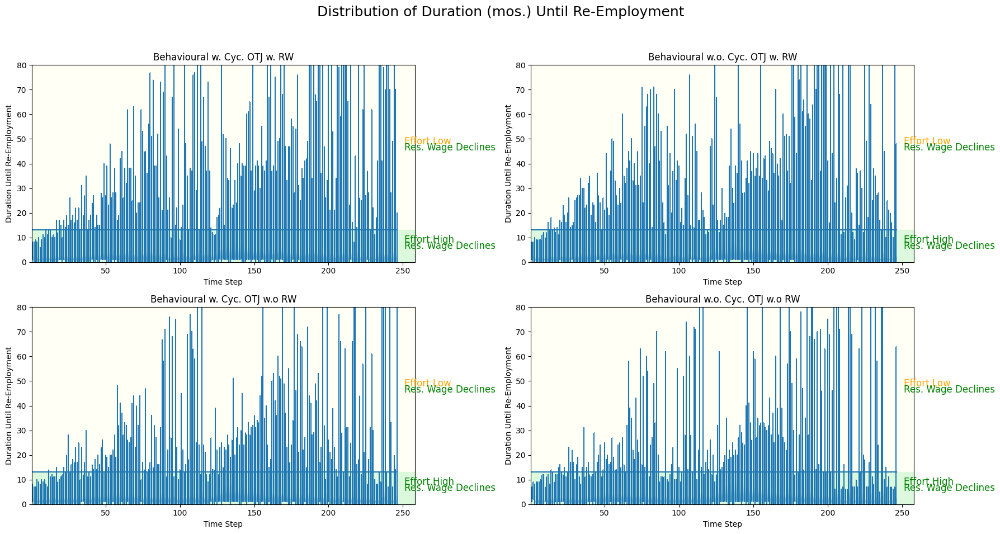

In [15]:

# Prepare the models to plot (skip "Non-behavioural")
plots = [(name, df) for name, df in filtered_time_to_emps.items() if "Non-behavioural" not in name]

# If you want to force exactly 4 subplots (2x2)
nrows, ncols = 2, 2
fig, axes = plt.subplots(nrows, ncols, figsize=(18, 10))
axes = axes.flatten()

# If there are more than 4 items, only plot first 4 (change if you want different behavior)
if len(plots) > len(axes):
    print(f"Warning: {len(plots)} series found but only {len(axes)} subplots available — plotting first {len(axes)}.")
plots_to_plot = plots[:len(axes)]

for ax, (name, df) in zip(axes, plots_to_plot):
    # Prepare data: list of arrays, one per time step
    time_steps = sorted(df['Time Step'].unique())
    data = [df[df['Time Step'] == t]['UEDuration'].values for t in time_steps]

    threshold = 13

    # Shade regions
    ax.axhspan(0, threshold, color="lightgreen", alpha=0.3)
    ax.axhspan(threshold, 80, color="lightyellow", alpha=0.3)

    # Violin plot
    ax.violinplot(data, positions=time_steps, showmeans=False, showmedians=True, widths=1.2)

    # Horizontal line at threshold
    xmin = min(time_steps) - 0.5
    xmax = max(time_steps) + 0.5
    ax.hlines(y=threshold, xmin=xmin, xmax=xmax)

    ax.set_xlabel('Time Step')
    ax.set_ylabel('Duration Until Re-Employment')
    ax.set_ylim(0, 80)
    ax.set_title(f'{name}')

    # Extend x-limits a bit to make room for annotation to the right
    ax.set_xlim(xmin, max(time_steps) + 12)

    # Annotations (kept from your original)
    ax.text(
        x=max(time_steps) + 5, y=(threshold + 5) / 2,
        s="Effort High", color="green", fontsize=12, va="center"
    )
    ax.text(
        x=max(time_steps) + 5, y=threshold / 2,
        s="Res. Wage Declines", color="green", fontsize=12, va="center"
    )
    ax.text(
        x=max(time_steps) + 5, y=(threshold + 85) / 2,
        s="Effort Low", color="orange", fontsize=12, va="center"
    )
    ax.text(
        x=max(time_steps) + 5, y=(threshold + 80) / 2,
        s="Res. Wage Declines", color="green", fontsize=12, va="center"
    )

# Turn off any unused subplots (if less than 4 series)
for ax in axes[len(plots_to_plot):]:
    ax.axis('off')

fig.suptitle("Distribution of Duration (mos.) Until Re-Employment", size=18)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])  # leave room for suptitle

if save_button:
    plt.savefig(os.path.join(output_path, "behavioural_regimes_time_to_reemp.png"))
    plt.show()
else:
    plt.show()
plt.close()


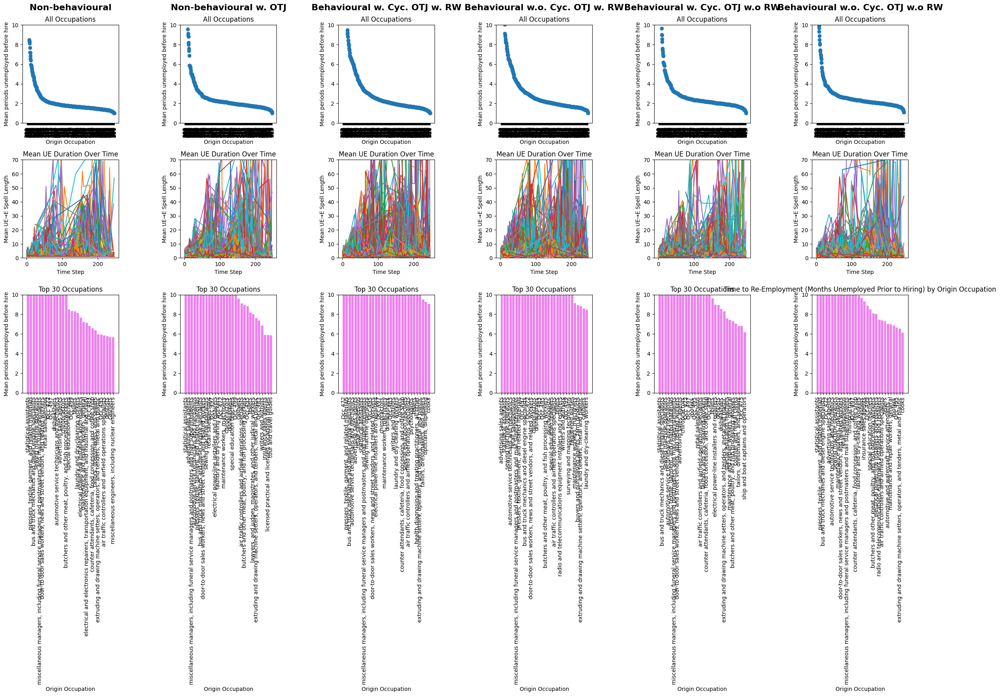

In [16]:
tmp = pd.read_csv(path + "dRC_Replication/data/ipums_variables.csv")
fig, axes = plt.subplots(3, 6, figsize=(24, 18))
model_names = filtered_time_to_emps.keys()
for col, i in enumerate(model_names):
    # 1. Bar plot (all occupations)
    mean_ue_by_origin = (
        filtered_time_to_emps[i]
        .groupby('OriginOccupation', as_index=True)['UEDuration']
        .mean()
        .sort_values(ascending=False)
    )
    x = np.arange(len(mean_ue_by_origin))
    axes[0, col].scatter(x, mean_ue_by_origin.values)
    axes[0, col].set_xticks(x)
    axes[0, col].set_xticklabels(mean_ue_by_origin.index.astype(str), rotation=90)
    axes[0, col].set_ylabel('Mean periods unemployed before hire')
    axes[0, col].set_xlabel('Origin Occupation')
    axes[0, col].set_title(f'All Occupations')
    axes[0,col].set_ylim(0,10)
    
    # 2. Bar plot (top 30 occupations)
    mean_ue_by_origin_short = mean_ue_by_origin.iloc[0:30]
    x_short = np.arange(len(mean_ue_by_origin_short))
    # Get labels from tmp for each occupation, fallback to Occ {id}
    labels_short = [tmp.loc[occ, 'label'] if occ in tmp.index else f'Occ {occ}' for occ in mean_ue_by_origin_short.index]
    axes[2, col].bar(x_short, mean_ue_by_origin_short.values, color="violet")
    axes[2, col].set_xticks(x_short)
    axes[2, col].set_xticklabels(labels_short, rotation=90)
    axes[2, col].set_ylabel('Mean periods unemployed before hire')
    axes[2, col].set_xlabel('Origin Occupation')
    axes[2, col].set_title(f'Top 30 Occupations')
    axes[2,col].set_ylim(0,10)

    
    # 3. Line plot (mean UE duration by origin occupation and time step)
    mean_ue_by_origin_time = (
        filtered_time_to_emps[i]
        .groupby(['OriginOccupation', 'Time Step'])['UEDuration']
        .mean()
        .reset_index()
    )
    # mean_ue_by_origin_time = mean_ue_by_origin_time.loc[
    #     mean_ue_by_origin_time['OriginOccupation'].isin(mean_ue_by_origin_short.index)
    # ]
    for occ in mean_ue_by_origin_time['OriginOccupation'].unique():
        group = mean_ue_by_origin_time[mean_ue_by_origin_time['OriginOccupation'] == occ]
        label = tmp.loc[occ, 'label'] if occ in tmp.index else f'Occ {occ}'
        axes[1, col].plot(group['Time Step'], group['UEDuration'], label=label)
    axes[1, col].set_xlabel('Time Step')
    axes[1, col].set_ylabel('Mean UE→E Spell Length')
    axes[1, col].set_title(f'Mean UE Duration Over Time')
    axes[1,col].set_ylim(0,70)

    #if col == 0:
    #    axes[2, col].legend(ncol=1, fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
    # Column label
    axes[0, col].annotate(i, xy=(0.5, 1.15), xycoords='axes fraction', ha='center', fontsize=16, fontweight='bold')

plt.title("Time to Re-Employment (Months Unemployed Prior to Hiring) by Origin Occupation")
plt.tight_layout()
plt.show()


In [17]:
# fig, axes = plt.subplots(2, 4, figsize=(24, 18))
# model_names = list(name_map.values())
# for col, i in enumerate(model_names):
#     mean_ue_by_origin = (
#         filtered_time_to_emps[i]
#         .groupby('OriginOccupation', as_index=True)['UEDuration']
#         .mean()
#         .sort_values(ascending=False)
#     )

#     temp_origin = mean_ue_by_origin[(mean_ue_by_origin > 5) | mean_ue_by_origin.index.isin(trending_occs)]

#     x = np.arange(len(temp_origin))
#     labels = []
#     for occ in temp_origin.index:
#         label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'
#         labels.append(label)

#     plt.figure(figsize=(12, 6))

#     for k in range(len(temp_origin)):
#         if temp_origin.index[k] in trending_occs:
#             color = "red"
#         else:
#             color = "blue"
#         axes[0, col].bar(k, temp_origin.iloc[k], color=color)

#     plt.xticks(np.arange(len(temp_origin)), labels, rotation=90)
#     axes[0, col].bar(x, temp_origin.values)
#     axes[0, col].set_xticks(x)
#     axes[0, col].set_xticklabels(temp_origin.index.astype(str), rotation=90)
#     axes[0, col].set_ylabel('Mean periods unemployed before hire')
#     axes[0, col].set_xlabel('Origin Occupation')
#     axes[0, col].set_title(f'All Occupations')
#     axes[0, col].set_ylim(0,10)
#     # Column label
#     axes[0, col].annotate(i, xy=(0.5, 1.15), xycoords='axes fraction', ha='center', fontsize=16, fontweight='bold')

#     mean_ue_by_destination = (
#         filtered_time_to_emps[i]
#         .groupby('DestinationOccupation', as_index=True)['UEDuration']
#         .mean()
#         .sort_values(ascending=False)
#     )

#     temp_dest = mean_ue_by_destination[(mean_ue_by_destination > 5) | mean_ue_by_destination.index.isin(trending_occs)]

#     x = np.arange(len(temp_dest))
#     labels = []
#     for occ in temp_dest.index:
#         label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'
#         labels.append(label)

#     plt.figure(figsize=(12, 6))

#     for k in range(len(temp_dest)):
#         if temp_dest.index[k] in trending_occs:
#             color = "red"
#         else:
#             color = "blue"
#         axes[1, col].bar(k, temp_dest.iloc[k], color=color)

#     plt.xticks(np.arange(len(temp_dest)), labels, rotation=90)
#     axes[1, col].bar(x, temp_dest.values)
#     axes[1, col].set_xticks(x)
#     axes[1, col].set_xticklabels(temp_dest.index.astype(str), rotation=90)
#     axes[1, col].set_ylabel('Mean periods unemployed before hire')
#     axes[1, col].set_xlabel('Destination Occupation')
#     axes[1, col].set_title(f'All Occupations')
#     axes[1, col].set_ylim(0,10)
#     # Column label
#     axes[1, col].annotate(i, xy=(0.5, 1.15), xycoords='axes fraction', ha='center', fontsize=16, fontweight='bold')

# plt.title("Time to Re-Employment (Months Unemployed Prior to Hiring) by Origin Occupation")
# plt.tight_layout()
# plt.show()


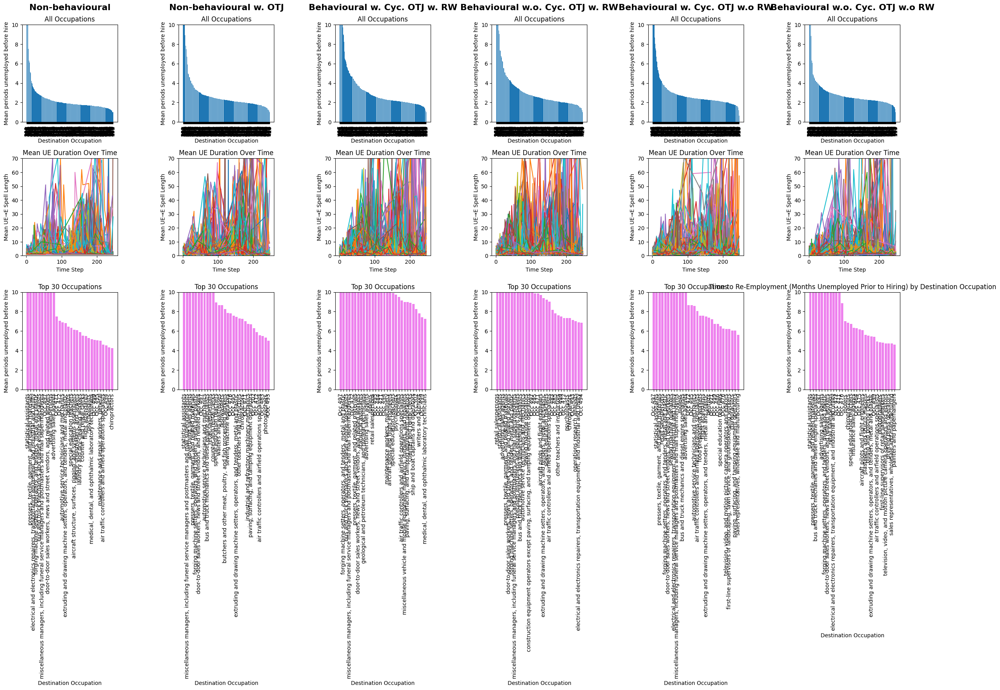

In [18]:
fig, axes = plt.subplots(3, 6, figsize=(24, 18))
model_names = filtered_time_to_emps.keys()
for col, i in enumerate(model_names):
    # 1. Bar plot (all occupations)
    mean_ue_by_dest = (
        filtered_time_to_emps[i]
        .groupby('DestinationOccupation', as_index=True)['UEDuration']
        .mean()
        .sort_values(ascending=False)
    )
    x = np.arange(len(mean_ue_by_dest))
    axes[0, col].bar(x, mean_ue_by_dest.values)
    axes[0, col].set_xticks(x)
    axes[0, col].set_xticklabels(mean_ue_by_dest.index.astype(str), rotation=90)
    axes[0, col].set_ylabel('Mean periods unemployed before hire')
    axes[0, col].set_xlabel('Destination Occupation')
    axes[0, col].set_title(f'All Occupations')
    axes[0,col].set_ylim(0,10)
    
    # 2. Bar plot (top 30 occupations)
    mean_ue_by_dest_short = mean_ue_by_dest.iloc[0:30]
    x_short = np.arange(len(mean_ue_by_dest_short))
    # Get labels from tmp for each occupation, fallback to Occ {id}
    labels_short = [tmp.loc[occ, 'label'] if occ in tmp.index else f'Occ {occ}' for occ in mean_ue_by_dest_short.index]
    axes[2, col].bar(x_short, mean_ue_by_dest_short.values, color="violet")
    axes[2, col].set_xticks(x_short)
    axes[2, col].set_xticklabels(labels_short, rotation=90)
    axes[2, col].set_ylabel('Mean periods unemployed before hire')
    axes[2, col].set_xlabel('Destination Occupation')
    axes[2, col].set_title(f'Top 30 Occupations')
    axes[2,col].set_ylim(0,10)

    
    # 3. Line plot (mean UE duration by origin occupation and time step)
    mean_ue_by_dest_time = (
        filtered_time_to_emps[i]
        .groupby(['DestinationOccupation', 'Time Step'])['UEDuration']
        .mean()
        .reset_index()
    )
    # mean_ue_by_origin_time = mean_ue_by_origin_time.loc[
    #     mean_ue_by_origin_time['DestinationOccupation'].isin(mean_ue_by_origin_short.index)
    # ]
    for occ in mean_ue_by_dest_time['DestinationOccupation'].unique():
        group = mean_ue_by_dest_time[mean_ue_by_dest_time['DestinationOccupation'] == occ]
        label = tmp.loc[occ, 'label'] if occ in tmp.index else f'Occ {occ}'
        axes[1, col].plot(group['Time Step'], group['UEDuration'], label=label)
    axes[1, col].set_xlabel('Time Step')
    axes[1, col].set_ylabel('Mean UE→E Spell Length')
    axes[1, col].set_title(f'Mean UE Duration Over Time')
    axes[1,col].set_ylim(0,70)

    #if col == 0:
    #    axes[2, col].legend(ncol=1, fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
    # Column label
    axes[0, col].annotate(i, xy=(0.5, 1.15), xycoords='axes fraction', ha='center', fontsize=16, fontweight='bold')

plt.title("Time to Re-Employment (Months Unemployed Prior to Hiring) by Destination Occupation")
plt.tight_layout()
plt.show()

In [19]:

def plot_trending_unemp(model_res, threshold, mod_label):
    # Compute slope of unemployment over time for each occupation
    slopes = {}
    mods = model_res[mod_label]
    for occ, group in mods.groupby('Occupation'):
        x = group['Time Step'].values
        y = group['Unemployment'].values
        if len(x) > 1:
            slope, intercept = np.polyfit(x, y, 1)  # linear fit
            slopes[occ] = slope
        else:
            slopes[occ] = np.nan

    slopes_series = pd.Series(slopes, name='Slope')

    upward_occs = slopes_series[slopes_series > 0.05].sort_values(ascending=False)
    print("Occupations with upward unemployment trend:")

    # Plot only the ones with the strongest upward trend
    top_upward = upward_occs.index

    plt.figure(figsize=(10, 6))
    for occ, group in mods[mods['Occupation'].isin(top_upward)].groupby('Occupation'):
        # Use tmp to get real label; fallback to occ if not found
        label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'
        plt.plot(group['Time Step'], group['UER'], label=label)

    plt.xlabel('Time Step')
    plt.ylabel('Unemployment')
    plt.title(f'{mod_label} - Occupations with Upward Unemployment Trend')
    handles, labels = plt.gca().get_legend_handles_labels()
    sorted_pairs = sorted(zip(labels, handles), key=lambda x: x[0])
    sorted_labels, sorted_handles = zip(*sorted_pairs)
    #plt.legend(sorted_handles, sorted_labels, ncol=1, fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    return top_upward

# for name in ["Behavioural w. Cyc. OTJ w.o RW", "Behavioural w.o. Cyc. OTJ w. RW"]: # "Non-behavioural", "Non-behavioural w. OTJ",
#     trending_occs = plot_trending_unemp(filtered_sim_results, 0.05, name)


In [20]:
# def plot_occupation_makeup(model_res, total: False):
#     if total:
#         plt.figure(figsize=(10, 6))
#         for id, name in model_res.items():
#             plt.plot(model_res[id]['Time Step'],model_res[id]['Retirees'], label=id)
#         plt.xlabel('Time Step')
#         plt.ylabel('Retirees')
#         plt.title(f'{id} - Total Retirees')
#         plt.legend()
#         plt.tight_layout()
#         plt.show()
#     else:
#         for id, name in model_res.items():
#             plt.figure(figsize=(10, 6))
#             for occ in np.unique(model_res[id]['Occupation']):
#                 xs = model_res[id][model_res[id]['Occupation'] == occ]
#                 plt.plot(range(len(xs)), xs['Retirees'], label=f'{id} - {occ}')
#             plt.xlabel('Time Step')
#             plt.ylabel('Retirees')
#             plt.title(f'{id} - Total Retirees')
#             plt.tight_layout()
#             plt.show()


# plot_occupation_makeup(filtered_sim_results, total = False)
# plot_occupation_makeup(filtered_model_results, total = True)

/var/folders/8b/bf75_lhn2ks3ff8jvrhctcvc0000gr/T/ipykernel_8769/3325792061.py:121: UserWarning: 

The arrowstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(G, pos, width=widths, alpha=0.6, arrows=directed, arrowstyle="-|>", arrowsize=10)


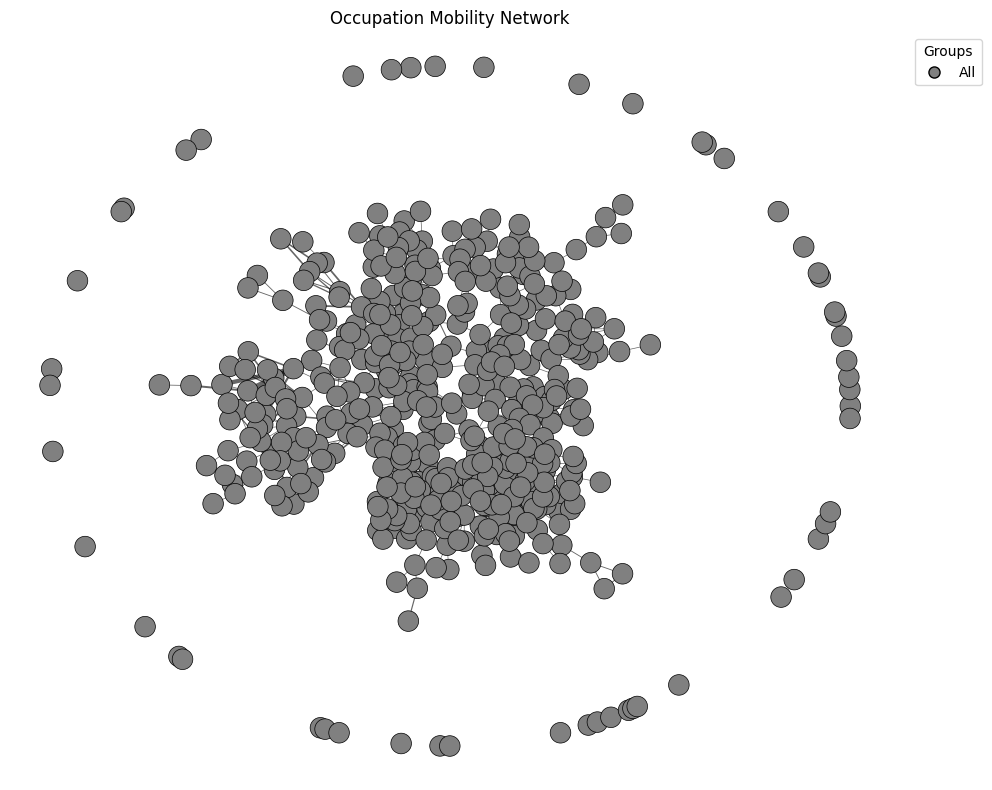

In [21]:
# Network graph from adjacency matrix (weighted, colored by node name)
# Requires: networkx, matplotlib, numpy, pandas
import networkx as nx
from matplotlib.lines import Line2D

def plot_network_from_matrix(
    A,
    directed=False,
    threshold=0.0,
    abs_threshold=False,
    normalize_edge_widths=True,
    max_edge_width=4.0,
    layout="spring",            # "spring" | "kamada_kawai" | "spectral" | "circular"
    seed=42,
    node_size=220,
    color_key=None,             # function: name -> group string; or dict {name: group}
    palette=None,               # dict {group: color} or None -> auto colormap
    title="Network graph",
):
    """
    A: adjacency as pd.DataFrame (preferred; index=columns=names) or np.ndarray.
       If ndarray, nodes will be named 'N0','N1',... and treated as undirected unless directed=True.
    directed: build DiGraph if True, else Graph.
    threshold: drop edges with weight <= threshold (or <= |threshold| if abs_threshold=True).
    abs_threshold: if True, threshold on absolute value.
    normalize_edge_widths: scale edge widths to [0, max_edge_width].
    color_key: 
        - function taking node name -> group label (str), or
        - dict mapping node name -> group, or
        - None to color all nodes the same.
    palette: dict mapping group -> matplotlib color. If None, auto-assign from tab20.
    """
    # ----- Standardize input -----
    if isinstance(A, pd.DataFrame):
        names = A.index.astype(str).tolist()
        assert list(A.columns.astype(str)) == names, "Adjacency DataFrame must have matching index/columns (same order)."
        M = A.values.astype(float)
    else:
        A = np.asarray(A, dtype=float)
        names = [f"N{i}" for i in range(A.shape[0])]
        M = A

    n = len(names)
    if M.shape[0] != n or M.shape[1] != n:
        raise ValueError("Adjacency matrix must be square.")

    # ----- Build graph -----
    G = nx.DiGraph() if directed else nx.Graph()
    G.add_nodes_from(names)

    # Add edges with weights (sparsify by threshold)
    for i in range(n):
        for j in range(n):
            if i == j:
                continue
            w = M[i, j]
            val = abs(w) if abs_threshold else w
            if val > threshold and w != 0:
                # For undirected matrices, avoid double-add: only i<j
                if not directed and j <= i:
                    continue
                G.add_edge(names[i], names[j], weight=float(w))

    if G.number_of_edges() == 0:
        print("No edges after thresholding.")
        return

    # ----- Layout -----
    rng = np.random.default_rng(seed)
    if layout == "spring":
        pos = nx.spring_layout(G, seed=seed, k=None)  # k=None lets NX choose based on log(n)
    elif layout == "kamada_kawai":
        pos = nx.kamada_kawai_layout(G)
    elif layout == "spectral":
        pos = nx.spectral_layout(G)
    elif layout == "circular":
        pos = nx.circular_layout(G)
    else:
        pos = nx.spring_layout(G, seed=seed)

    # ----- Node colors by index name -----
    # Build group per node
    if color_key is None:
        node_groups = {name: "All" for name in names}
    elif callable(color_key):
        node_groups = {name: str(color_key(name)) for name in names}
    elif isinstance(color_key, dict):
        node_groups = {name: str(color_key.get(name, "Other")) for name in names}
    else:
        raise TypeError("color_key must be None, function(name)->group, or dict {name: group}")

    groups = pd.Index(node_groups.values()).unique().tolist()
    # Palette
    if palette is None:
        # auto colors from tab20 (recycle if needed)
        base = plt.get_cmap("tab20").colors
        palette = {g: base[i % len(base)] for i, g in enumerate(groups)}
    else:
        # ensure all groups get a color
        for g in groups:
            palette.setdefault(g, "gray")

    node_colors = [palette[node_groups[name]] for name in names]

    # ----- Edge widths -----
    weights = np.array([d["weight"] for _, _, d in G.edges(data=True)], dtype=float)
    if normalize_edge_widths:
        wmin, wmax = np.nanmin(np.abs(weights)), np.nanmax(np.abs(weights))
        # avoid div-by-zero
        if wmax > 0:
            widths = (np.abs(weights) - wmin) / (wmax - wmin + 1e-12) * max_edge_width
            widths = np.clip(widths, 0.5, max_edge_width)
        else:
            widths = np.full_like(weights, 1.5)
    else:
        widths = np.clip(np.abs(weights), 0.5, max_edge_width)

    # ----- Draw -----
    plt.figure(figsize=(10, 8))
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_size, linewidths=0.5, edgecolors="black")
    nx.draw_networkx_edges(G, pos, width=widths, alpha=0.6, arrows=directed, arrowstyle="-|>", arrowsize=10)
    # If graph is not too large, label nodes
    if len(names) <= 60:
        nx.draw_networkx_labels(G, pos, font_size=8)

    # Legend for groups
    legend_handles = [Line2D([0], [0], marker='o', color='w',
                             label=str(g), markerfacecolor=palette[g],
                             markersize=8, markeredgecolor="black")
                      for g in groups]
    plt.legend(handles=legend_handles, title="Groups", bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.axis("off")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# ===== Example usage =====
# Suppose `A_df` is a pandas DataFrame (index=columns=occupation names) with weights.
# Color nodes by index name rule: e.g., prefix-based grouping.
# def my_color_key(name):
#     # Example rules – adapt to your naming convention
#     if name.startswith("Sales"): return "Sales"
#     if name.startswith("Tech"):  return "Tech"
#     if "Manager" in name:        return "Management"
#     return "Other"

def color_key(name):
    # If this node is in trending_occs, mark it "Trending"
    return "Trending" if int(name) in trending_occs else "Other"

palette = {
    "Trending": "red",
    "Other": "lightgray"
}

plot_network_from_matrix(mod_data['A'], 
                         layout = "kamada_kawai", directed=False, threshold=0.05,
                         #color_key=color_key, 
                         palette = palette,
                         
                         title="Occupation Mobility Network")

# Or if you have a Series mapping id->group:
# group_map = tmp  # pandas Series where index=occupation name/id, value=group string
# plot_network_from_matrix(A_df, threshold=0.1, color_key=group_map.to_dict())

In [22]:
# ===== Core: exclude same-occupation moves when counting entrants/exits =====
def _filter_cross_occ(df: pd.DataFrame, ignore_within: bool = True) -> pd.DataFrame:
    """Optionally drop rows where OriginOccupation == DestinationOccupation."""
    if ignore_within:
        return df[df['OriginOccupation'] != df['DestinationOccupation']]
    return df

# ===== Net entry (window summary) =====
def compute_net_entry(ue_spell_origin_df: pd.DataFrame, label_map=None, time_range=None, ignore_within: bool = True):
    """
    NetEntry_i = Entrants_i - Exits_i, excluding self-flows if ignore_within=True.
    ue_spell_origin_df columns: ['Time Step','OriginOccupation','DestinationOccupation','UEDuration']
    """
    df = ue_spell_origin_df.copy()
    if time_range is not None:
        tmin, tmax = time_range
        df = df[(df['Time Step'] >= tmin) & (df['Time Step'] <= tmax)]

    df = _filter_cross_occ(df, ignore_within=ignore_within)

    entrants = df.groupby('DestinationOccupation').size().rename("Entrants")
    exits    = df.groupby('OriginOccupation').size().rename("Exits")

    net_entry = pd.concat([entrants, exits], axis=1).fillna(0)
    net_entry['NetEntry'] = net_entry['Entrants'] - net_entry['Exits']

    if label_map is not None:
        if isinstance(label_map, pd.Series):
            net_entry['Label'] = [label_map.get(i, str(i)) for i in net_entry.index]
        elif isinstance(label_map, dict):
            net_entry['Label'] = [label_map.get(i, str(i)) for i in net_entry.index]
    else:
        net_entry['Label'] = net_entry.index.astype(str)

    return net_entry.sort_values('NetEntry', ascending=False)

def plot_net_entry_highlight(net_entry: pd.DataFrame,
                             trending_occs,
                             topk: int = 40,
                             title: str = "Net entry by occupation (highlighting)"):
    """
    Bars are green by default; bars for occ IDs in trending_occs are red.
    trending_occs: iterable of occupation IDs that match net_entry.index dtype.
    """
    s = net_entry.sort_values('NetEntry', ascending=False)
    if isinstance(topk, int):
        s = s.head(topk)

    # Coerce trending ids to index dtype (robust to str/int mismatch)
    idx_dtype = s.index.dtype
    try:
        trend_set = set(pd.Index(trending_occs).astype(idx_dtype))
        key_series = s.index
    except Exception:
        trend_set = set(map(str, trending_occs))
        key_series = s.index.map(str)

    labels = s['Label'] if 'Label' in s.columns else s.index.astype(str)
    x = np.arange(len(s))
    colors = ['red' if key in trend_set else 'green' for key in key_series]

    plt.figure(figsize=(12, 6))
    plt.bar(x, s['NetEntry'].values, color=colors)
    plt.axhline(0, color="black", linewidth=1)
    plt.xticks(x, labels, rotation=90)
    plt.ylabel("Net Entry (Entrants - Exits)")
    plt.xlabel("Occupation")
    plt.title(title)
    from matplotlib.patches import Patch
    plt.legend(handles=[
        Patch(facecolor='green', edgecolor='black', label='Other occupations'),
        Patch(facecolor='red',   edgecolor='black', label='Highlighted (trending_occs)'),
    ], loc='best')
    plt.tight_layout(); plt.show()

def build_net_entry_timeseries(ue_spell_origin_df: pd.DataFrame, ignore_within: bool = True) -> pd.DataFrame:
    """
    Panel of net entry per occupation per time step, excluding self-flows if requested.
    Returns columns: ['Time Step','Occupation','Entrants','Exits','NetEntry']
    """
    # 1) Optionally remove within-occupation moves
    df = ue_spell_origin_df.copy()
    if ignore_within:
        df = df[df['OriginOccupation'] != df['DestinationOccupation']]

    # 2) Build entrants and exits as Series with a *consistent* MultiIndex: (Time Step, Occupation)
    entrants_ts = (
        df.groupby(['Time Step', 'DestinationOccupation'])
          .size()
          .rename('Entrants')
    )
    entrants_ts.index = pd.MultiIndex.from_tuples(
        entrants_ts.index, names=['Time Step', 'Occupation']
    )

    exits_ts = (
        df.groupby(['Time Step', 'OriginOccupation'])
          .size()
          .rename('Exits')
    )
    exits_ts.index = pd.MultiIndex.from_tuples(
        exits_ts.index, names=['Time Step', 'Occupation']
    )

    # 3) Create the union index and reindex both series to it (ensures perfect alignment)
    union_idx = entrants_ts.index.union(exits_ts.index)
    entrants_ts = entrants_ts.reindex(union_idx, fill_value=0)
    exits_ts    = exits_ts.reindex(union_idx, fill_value=0)

    # 4) Combine into a single DataFrame and compute NetEntry
    panel = pd.concat([entrants_ts, exits_ts], axis=1)
    panel['NetEntry'] = panel['Entrants'] - panel['Exits']

    # 5) Return as a tidy DataFrame with explicit columns
    panel = panel.reset_index()  # columns: Time Step, Occupation, Entrants, Exits, NetEntry
    return panel[['Time Step', 'Occupation', 'Entrants', 'Exits', 'NetEntry']]

def plot_net_entry_heatmap(net_ts: pd.DataFrame, occ_ids=None, label_map=None, title="Net entry heatmap"):
    piv = net_ts.pivot_table(index="Occupation", columns="Time Step", values="NetEntry", aggfunc="sum")
    if occ_ids is not None:
        piv = piv.loc[piv.index.intersection(occ_ids)]
    order = piv.var(axis=1).sort_values(ascending=False).index  # order by volatility
    piv = piv.loc[order]
    plt.figure(figsize=(14, max(6, 0.25*len(piv))))
    im = plt.imshow(piv.values, aspect="auto", cmap="RdBu", interpolation="nearest")
    plt.colorbar(im, label="Net Entry (Entrants - Exits)")
    labels = [label_map.get(i, str(i)) if label_map is not None else str(i) for i in piv.index]
    plt.yticks(np.arange(len(piv)), labels)
    plt.xlabel("Time Step"); plt.ylabel("Occupation")
    plt.title(title); plt.tight_layout(); plt.show()

def plot_net_entry_stability(net_ts: pd.DataFrame, 
                             label_map=None, 
                             topk=None, 
                             trending_occs=None, 
                             title="Stability of net entry"):
    """
    Scatterplot of mean vs. std dev of net entry by occupation.
    Points in trending_occs are colored red, others blue.
    """
    stats = net_ts.groupby("Occupation")["NetEntry"].agg(["mean", "std"])
    if isinstance(topk, int):
        stats = stats.sort_values("std", ascending=False).head(topk)

    # Handle type coercion between stats.index and trending_occs
    if trending_occs is not None:
        idx_dtype = stats.index.dtype
        try:
            trend_set = set(pd.Index(trending_occs).astype(idx_dtype))
            key_series = stats.index
        except Exception:
            # fallback: compare as strings
            trend_set = set(map(str, trending_occs))
            key_series = stats.index.map(str)
        colors = ["red" if k in trend_set else "blue" for k in key_series]
    else:
        colors = "blue"

    labels = [label_map.get(i, str(i)) if label_map is not None else str(i) 
              for i in stats.index]

    plt.figure(figsize=(8,6))
    plt.scatter(stats["mean"], stats["std"], c=colors)
    for x, y, lbl in zip(stats["mean"], stats["std"], labels):
        plt.text(x, y, lbl, fontsize=8, ha="right", va="bottom")
    plt.axvline(0, color="gray", linestyle="--")
    plt.xlabel("Mean net entry"); plt.ylabel("Std dev of net entry")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# ===== Example usage =====
# 1) Window summary (excludes same-occupation moves by default)
net_entry = compute_net_entry(time_to_emps['otj_nonbehav'], label_map=tmp, time_range=None, ignore_within=True)
#plot_net_entry_highlight(net_entry, trending_occs = trending_occs, topk=465,
 #                         title="Net entry (excluding within-occupation moves)")


# 2) Time-series view (stability/volatility), also excluding self-flows
net_ts = build_net_entry_timeseries(time_to_emps['otj_nonbehav'], ignore_within=True)
#plot_net_entry_heatmap(net_ts, occ_ids = trending_occs, label_map=tmp, title="Net entry heatmap (no self-flows)")
#plot_net_entry_stability(net_ts, label_map=tmp, topk=100, trending_occs = trending_occs, title="Net entry stability (mean vs std)")

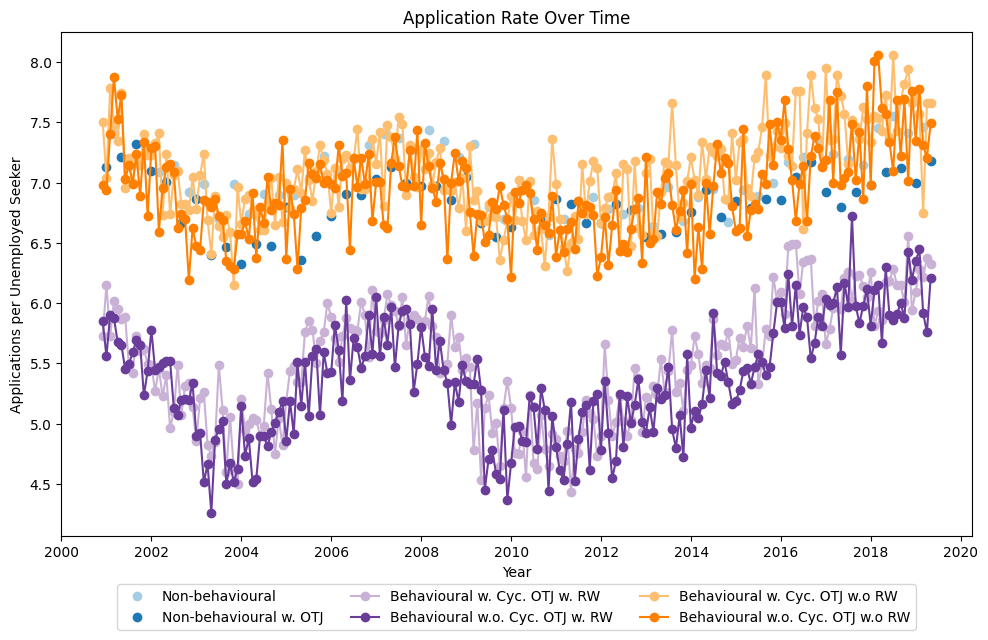

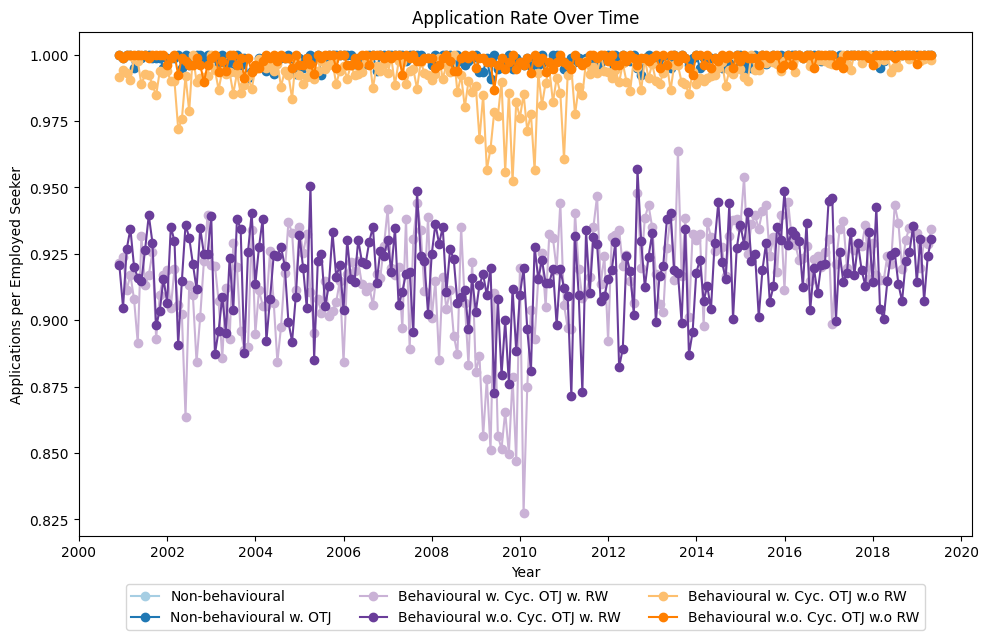

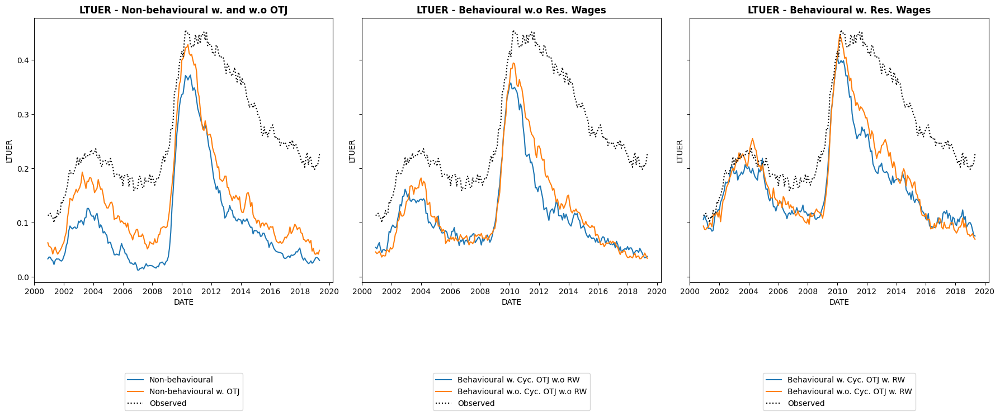

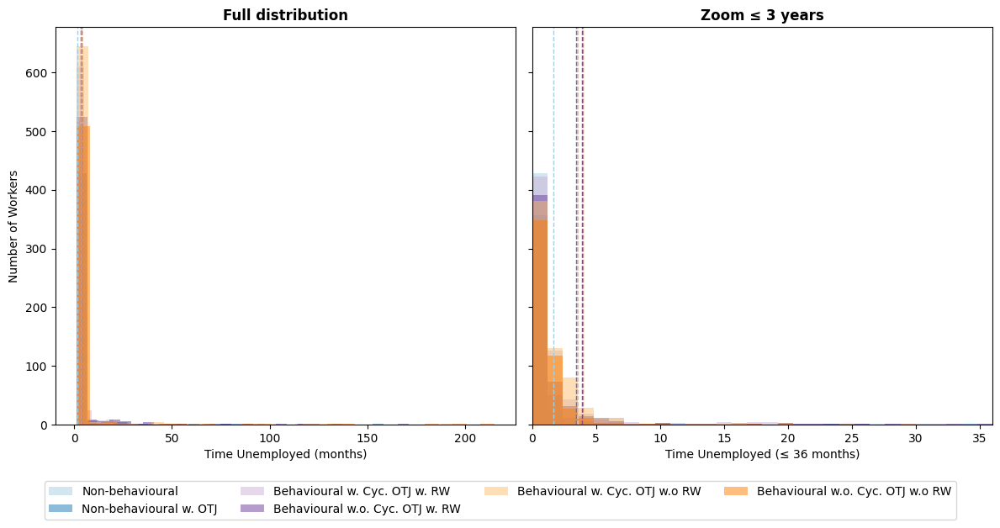

In [23]:

plt.figure(figsize=(10, 6))
for i, (name, item) in enumerate(seekers_recs.items()):
    if name == "Non-behavioural":
        # Plot every other value starting at the first place (index 0)
        plt.plot(item['DATE'][3::4], item['Application Effort (U)'][3::4], color = plot_colors[name], marker='o', label=f"{name}" , linestyle = "")
    elif name == "Non-behavioural w. OTJ":
        # Plot every other value starting at the second place (index 1)
        plt.plot(item['DATE'][1::4], item['Application Effort (U)'][1::4],  color = plot_colors[name], marker='o', label=f"{name}", linestyle = "")
    else:
        plt.plot(item['DATE'], item['Application Effort (U)'], marker='o', label=name,  color = plot_colors[name])
plt.xlabel('Year')
plt.ylabel('Applications per Unemployed Seeker')
plt.title('Application Rate Over Time')
plt.tight_layout()
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.2), 
               ncol=3, frameon=True, fontsize=10)

# Ensure the output directory exists
os.makedirs(output_path, exist_ok=True)

# Now save
plt.savefig(os.path.join(output_path, "applications_per_unemployed_seeker.png"))
plt.show()

plt.figure(figsize=(10, 6))
for i, (name, item) in enumerate(seekers_recs.items()):
    plt.plot(item['DATE'], item['Application Effort (E)'], marker='o', label=name, color = plot_colors[name],)
plt.xlabel('Year')
plt.ylabel('Applications per Employed Seeker')
plt.title('Application Rate Over Time')
plt.tight_layout()
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.2), 
               ncol=3, frameon=True, fontsize=10)

# --- plotting with renamed keys ---
plot_ltuer(filtered_model_results, observation, 
           sep_strings=[("Non-behavioural", "Non-behavioural w. and w.o OTJ"), 
                        ("w.o RW", "Behavioural w.o Res. Wages"),
                        ("w. RW", "Behavioural w. Res. Wages")], 
           sep=True, save=save_button, path=output_path)

plot_ltuer_dist(filtered_net_results, gender=False, 
                names=list(filtered_net_results.keys()), 
                save=save_button, path=output_path, colors = plot_colors)


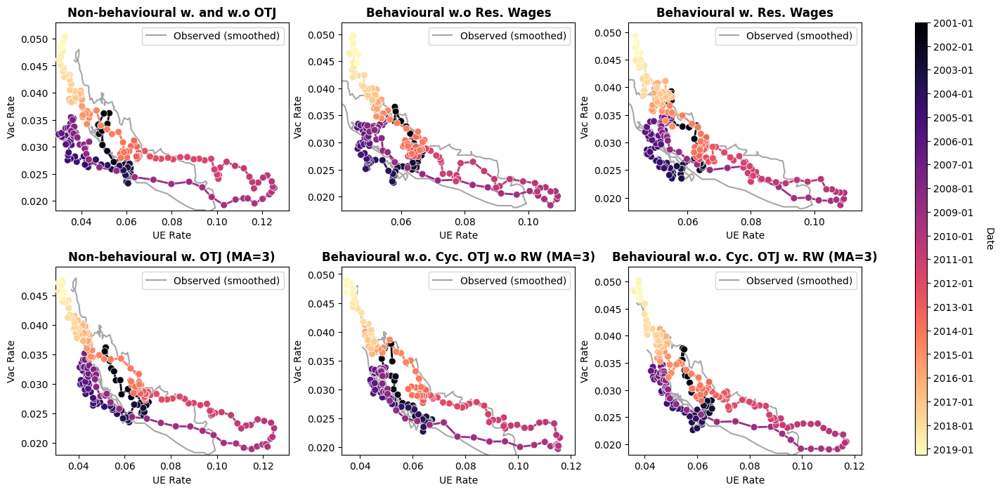

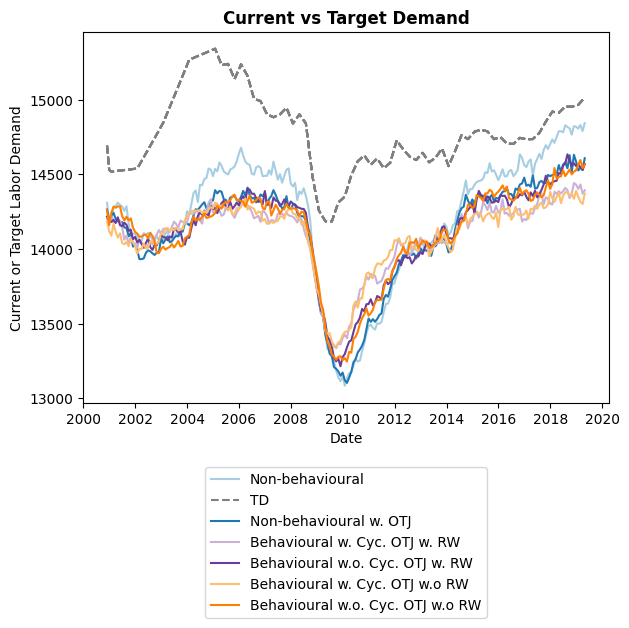

In [24]:
plot_bev_curve_color(filtered_model_results, observation, 
           sep_strings=[("Non-behavioural", "Non-behavioural w. and w.o OTJ"), 
                        ("w.o RW", "Behavioural w.o Res. Wages"),
                        ("w. RW", "Behavioural w. Res. Wages")], 
               sep=True, save=save_button, path=output_path, smooth = 3, viridis_color = 'magma')

plot_cd_vs_td(filtered_model_results, save=save_button, path=output_path, colors = plot_colors)

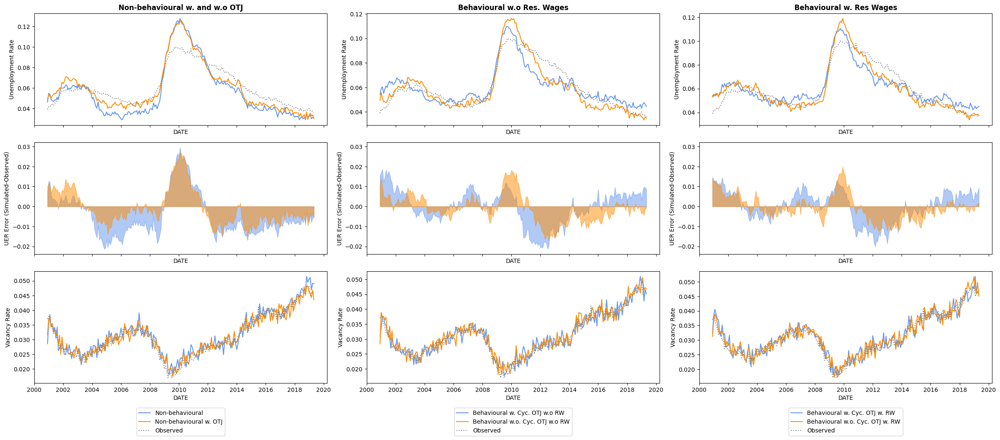

In [25]:
plot_uer_vac(filtered_model_results, observation, 
           sep_strings=[("Non-behavioural", "Non-behavioural w. and w.o OTJ"), 
                        ("w.o RW", "Behavioural w.o Res. Wages"),
                        ("w. RW", "Behavioural w. Res Wages")], 
             sep=True, save=save_button, path=output_path, free_date_scale=steady_state_run, calib_date = calib_date)

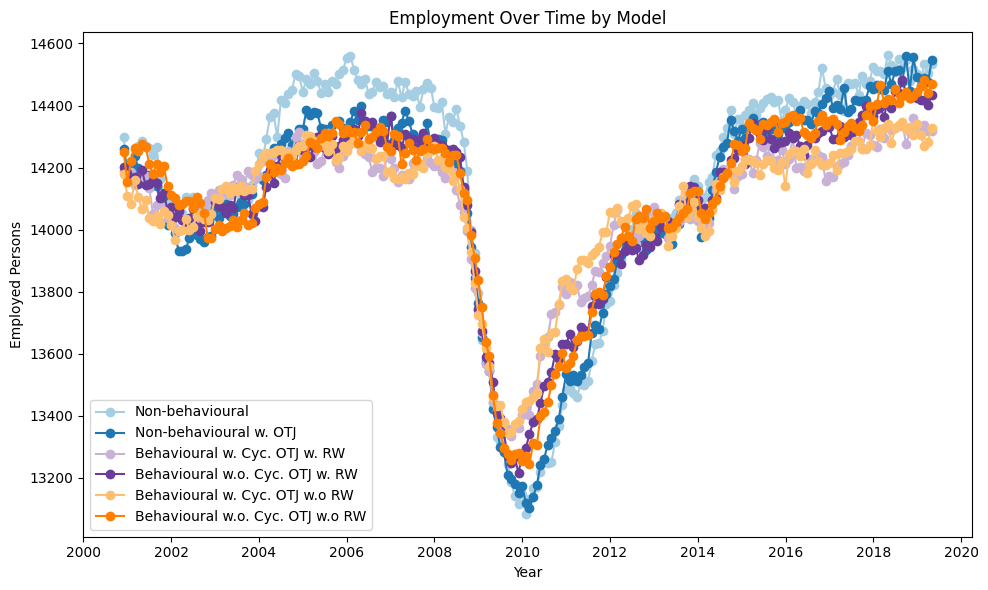

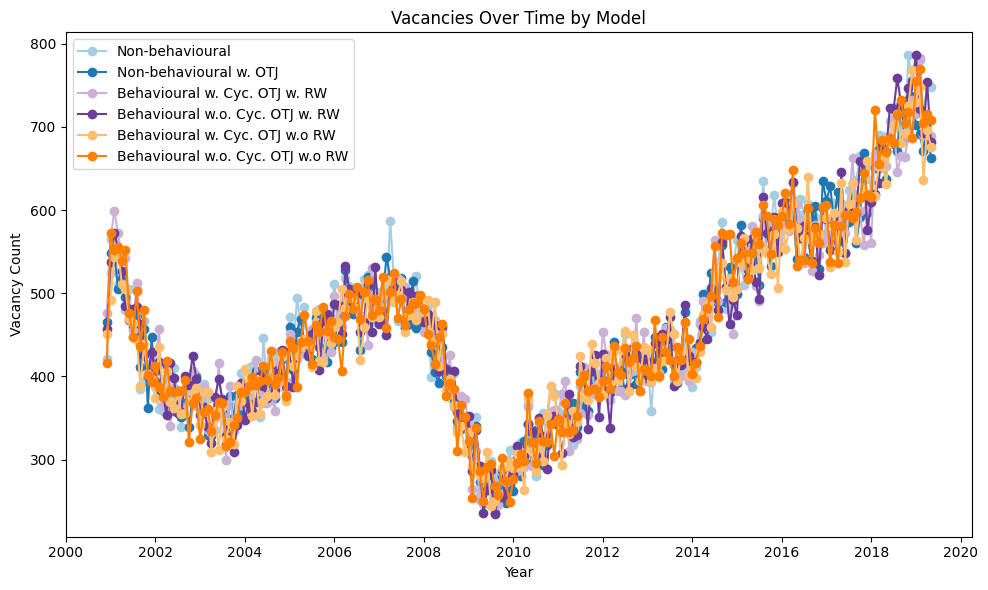

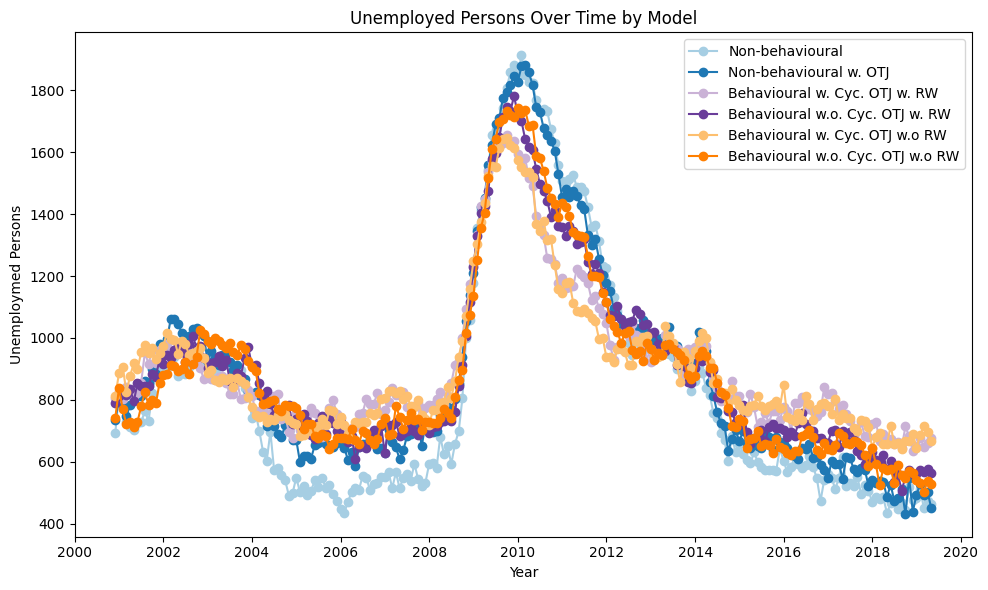

In [26]:
plt.figure(figsize=(10, 6))
for i, (name, item) in enumerate(filtered_model_results.items()):
    plt.plot(item['DATE'], item['Employment'], marker='o', label=name, color = plot_colors[name])
plt.xlabel('Year')
plt.ylabel('Employed Persons')
plt.title('Employment Over Time by Model')
plt.tight_layout()
plt.legend()

plt.figure(figsize=(10, 6))
for i, (name, item) in enumerate(filtered_model_results.items()):
    plt.plot(item['DATE'], item['Vacancies'], marker='o', label=name, color = plot_colors[name])
plt.xlabel('Year')
plt.ylabel('Vacancy Count')
plt.title('Vacancies Over Time by Model')
plt.tight_layout()
plt.legend()

plt.figure(figsize=(10, 6))
for i, (name, item) in enumerate(filtered_model_results.items()):
    plt.plot(item['DATE'], item['Unemployment'], marker='o', label=name, color = plot_colors[name])
plt.xlabel('Year')
plt.ylabel('Unemploymed Persons')
plt.title('Unemployed Persons Over Time by Model')
plt.tight_layout()
plt.legend()


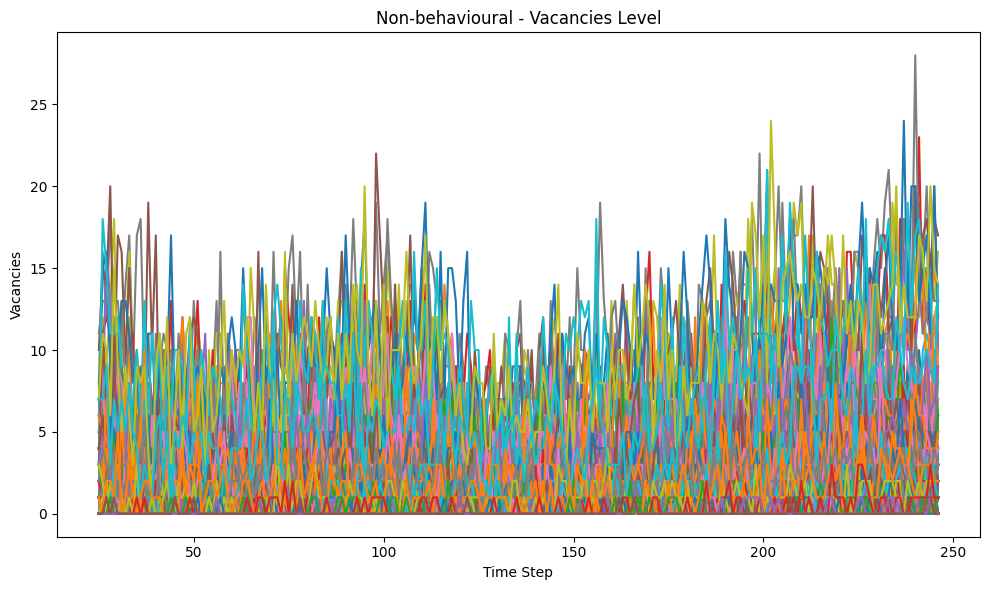

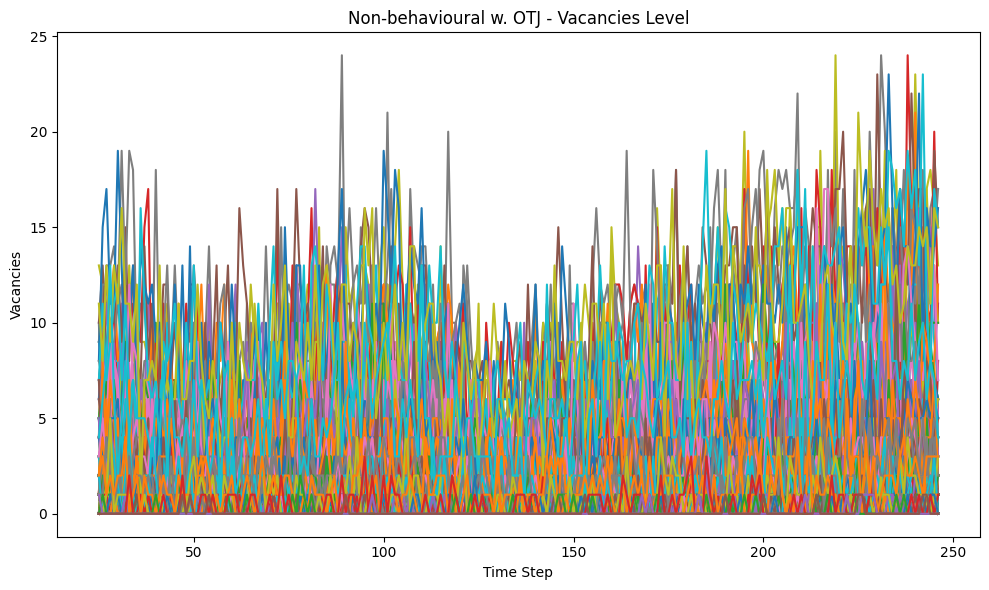

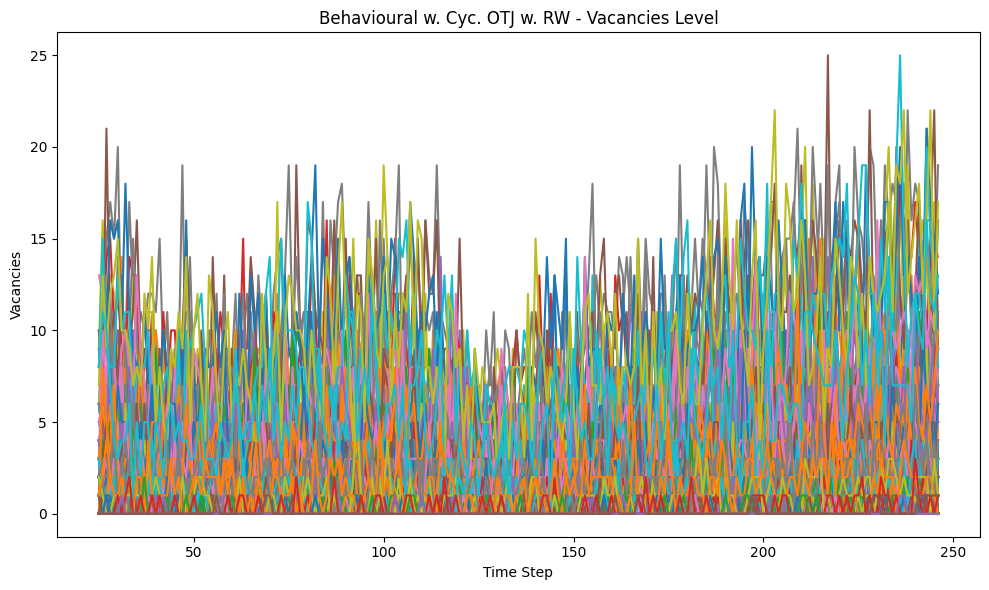

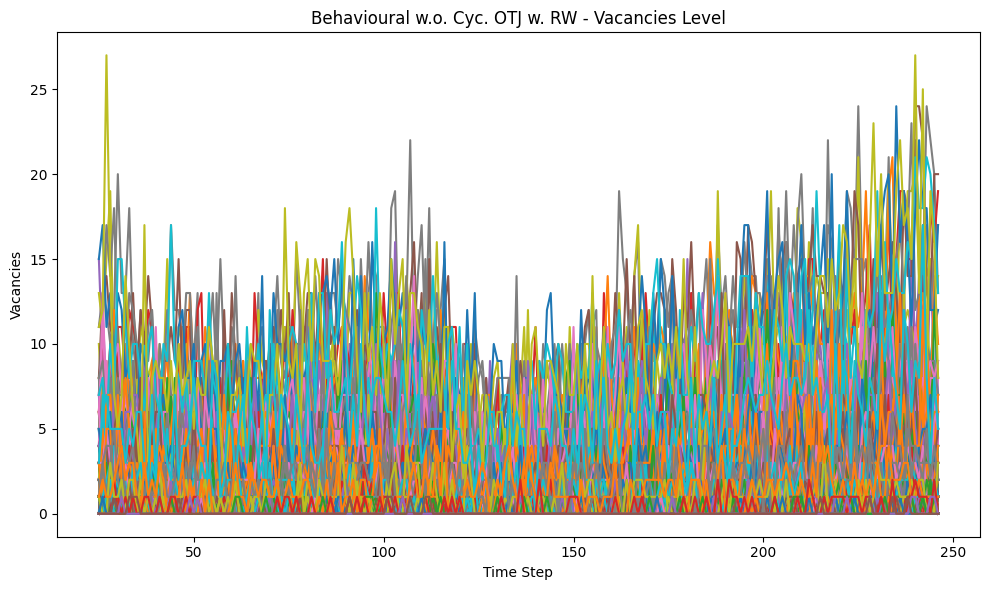

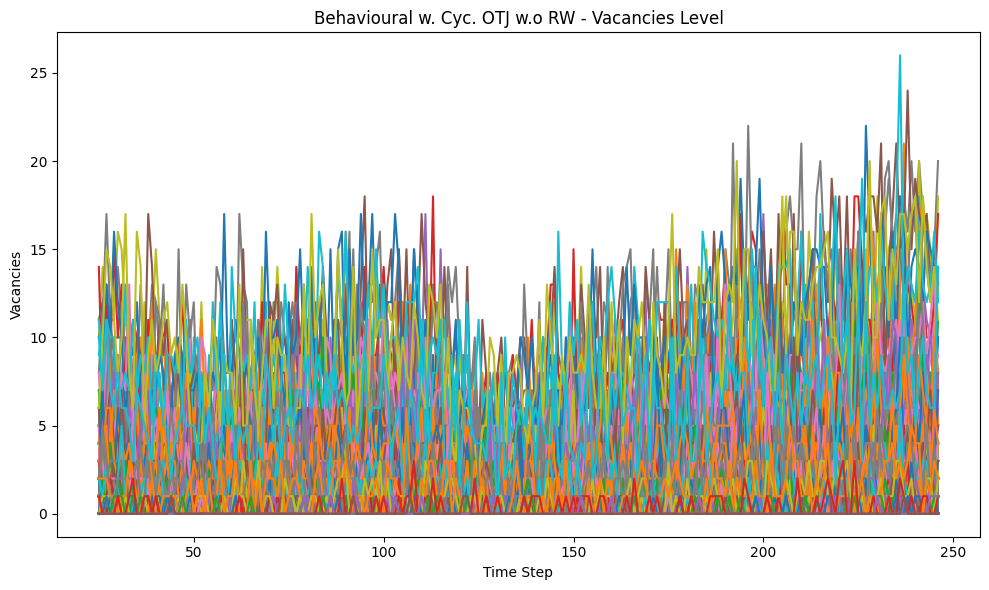

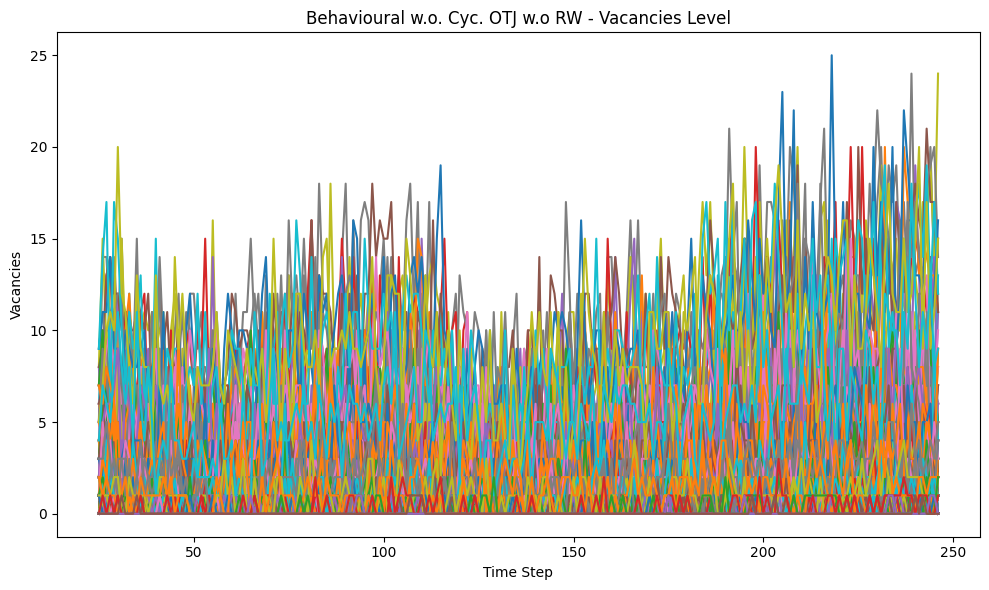

In [27]:
for i, (name, item) in enumerate(filtered_sim_results.items()):
    plt.figure(figsize=(10, 6))
    for occ, group in item.groupby('Occupation'):
        # Use tmp to get real label; fallback to occ if not found
        label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'
        plt.plot(group['Time Step'], group['Vacancies'], label=label)

    plt.xlabel('Time Step')
    plt.ylabel('Vacancies')
    plt.title(f'{name} - Vacancies Level')
    #plt.legend()
    plt.tight_layout()
    plt.show()


In [28]:
# for i, (name, item) in enumerate(filtered_sim_results.items()):

#     plt.figure(figsize=(10, 6))
#     for occ, group in item.groupby('Occupation'):
#         # Use tmp to get real label; fallback to occ if not found
#         label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'
#         plt.plot(group['Time Step'], group['Employment'], label=label)

#     plt.xlabel('Time Step')
#     plt.ylabel('Employment')
#     plt.title(f'{name} - Employment Level')
#     #plt.legend()
#     plt.tight_layout()
#     plt.show()

In [29]:

# THRESH = 0.75
# for i, (name, item) in enumerate(filtered_sim_results.items()):
#     plt.figure(figsize=(10, 6))

#     # compute fraction of time each occupation has Vacancies == 0
#     # handle NaNs safely by dropping them from the denominator
#     zero_frac = (
#         item.groupby('Occupation')['Vacancies']
#             .apply(lambda s: (s == 0).sum() / s.dropna().shape[0] if s.dropna().shape[0] > 0 else 0.0)
#     )

#     # occupations meeting the threshold
#     occs_to_plot = zero_frac[zero_frac > THRESH].index.tolist()
#     print(f"{name}: plotting {len(occs_to_plot)} occupations with >{THRESH*100:.0f}% zeros")

#     # iterate groups and plot only the selected occupations
#     for occ, group in item.groupby('Occupation'):
#         if occ not in occs_to_plot:
#             continue

#         # get label; fallback if missing
#         label = tmp['label'].loc[occ] if occ in tmp.index else f'Occ {occ}'

#         plt.plot(group['Time Step'], group['Vacancies'], label=label)
#         # optionally mark zero points
#         zeros = group[group['Vacancies'] == 0]
#         if not zeros.empty:
#             plt.scatter(zeros['Time Step'], zeros['Vacancies'], color='red', s=20, zorder=3)

#     plt.xlabel('Time Step')
#     plt.ylabel('Vacancies')
#     plt.title(f'{name} - Occupations with >{int(THRESH*100)}% zero vacancies')
#     plt.legend(loc='best', fontsize='small', ncol=2)
#     plt.tight_layout()
#     plt.show()

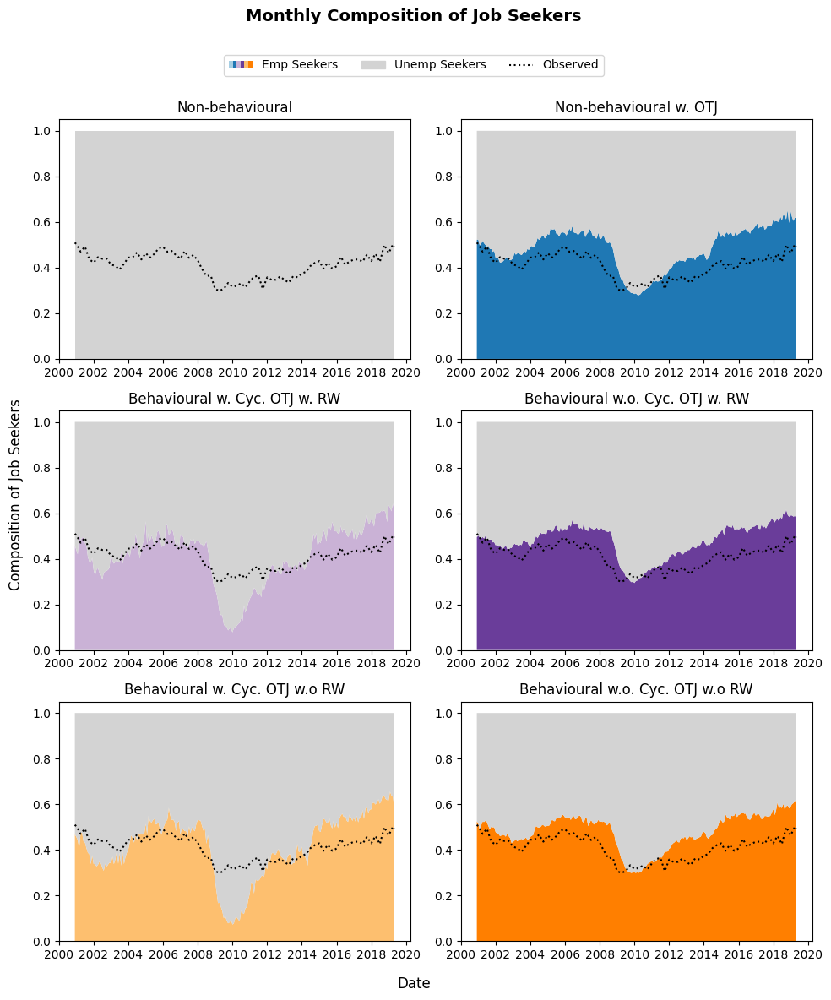

In [30]:
plot_seeker_comp(seekers_recs, seekers_comp_obs, sep=True, share=True,
                 save=save_button , path=output_path, colors = plot_colors)

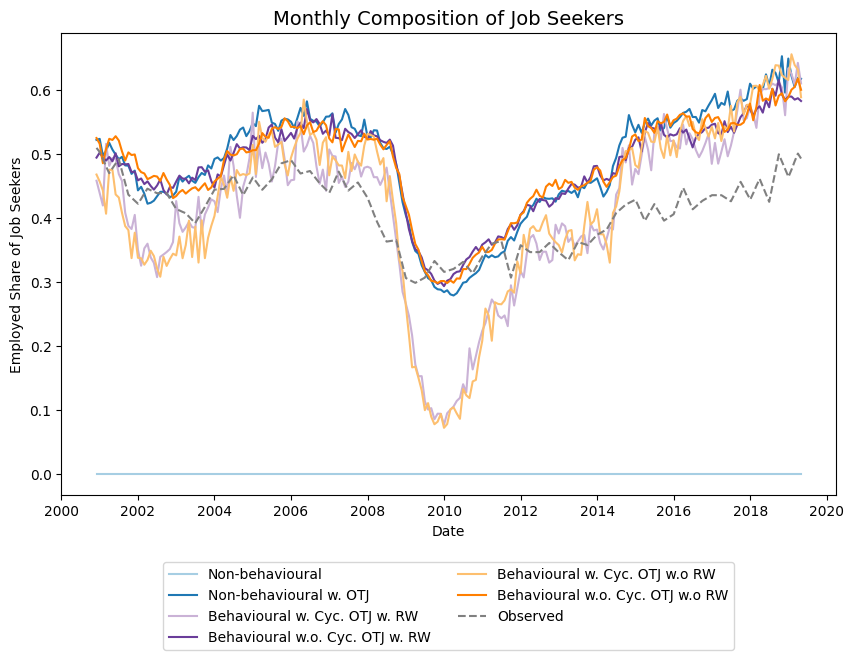

In [31]:

plot_seeker_comp_line(filtered_model_results, seekers_comp_obs, save=save_button , path=output_path, colors = plot_colors)


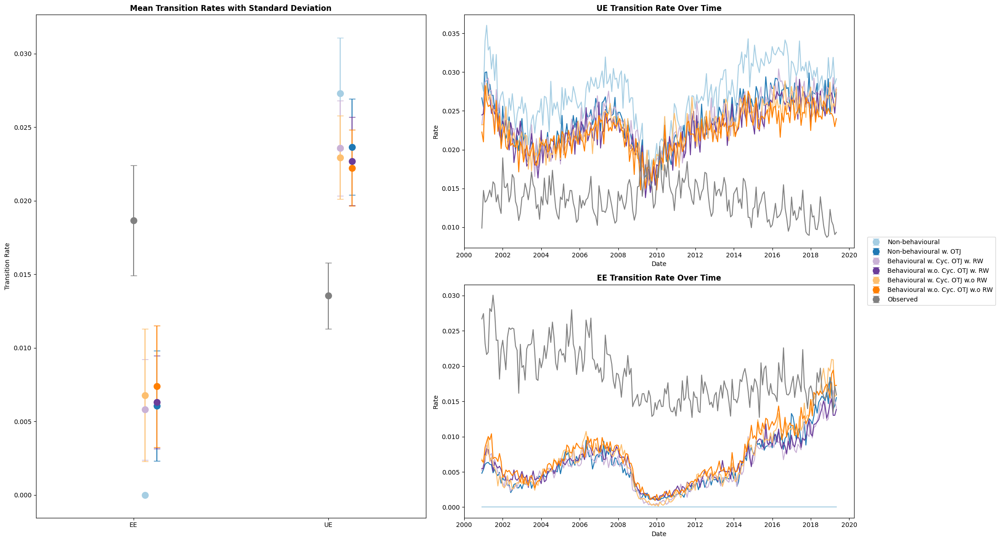

In [32]:

all_rates_new = pd.read_csv('data/transition_rates_96_24.csv')
all_rates_new = all_rates_new[(all_rates_new['date'] >= calib_date[0]) & (all_rates_new['date'] <= calib_date[1])]
all_rates_new['DATE'] = pd.to_datetime(all_rates_new['date'])

plot_trans_rates(filtered_model_results, observation = all_rates_new, save = save_button, path = output_path, colors = plot_colors)


/Users/ebbamark/Documents/Documents - Nuff-Malham/GitHub/transition_abm/calibration_remote/plot_funs.py:479: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  annual_data = res.set_index('DATE').resample(freq).mean()


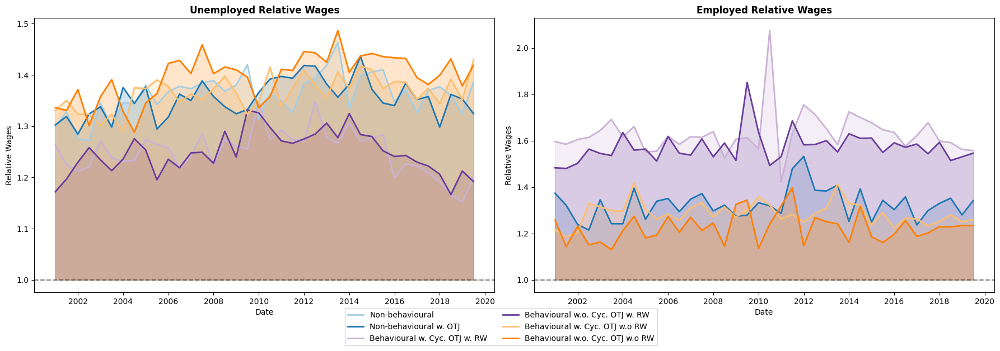

In [33]:
plot_rel_wages(filtered_model_results, save = save_button, path = output_path, freq = '6M', colors = plot_colors)

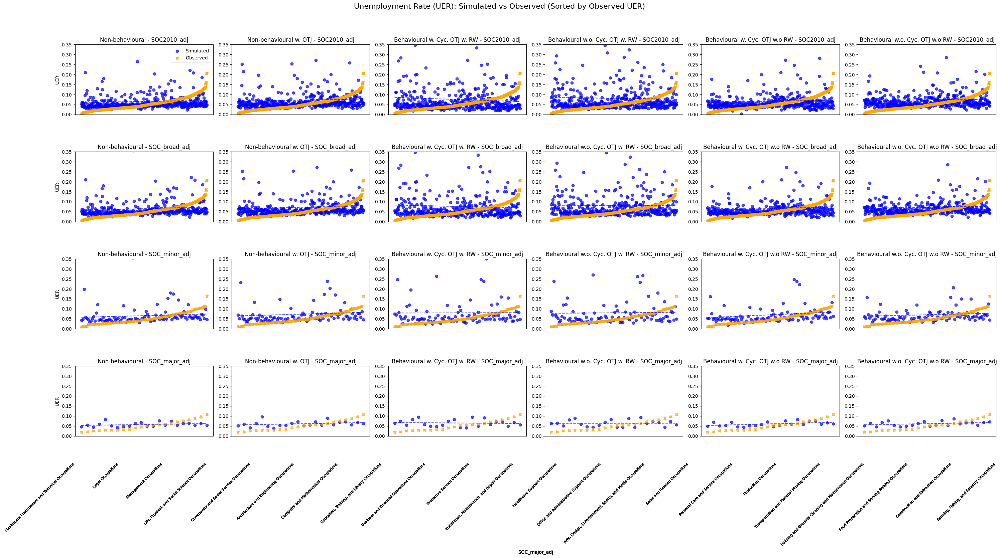

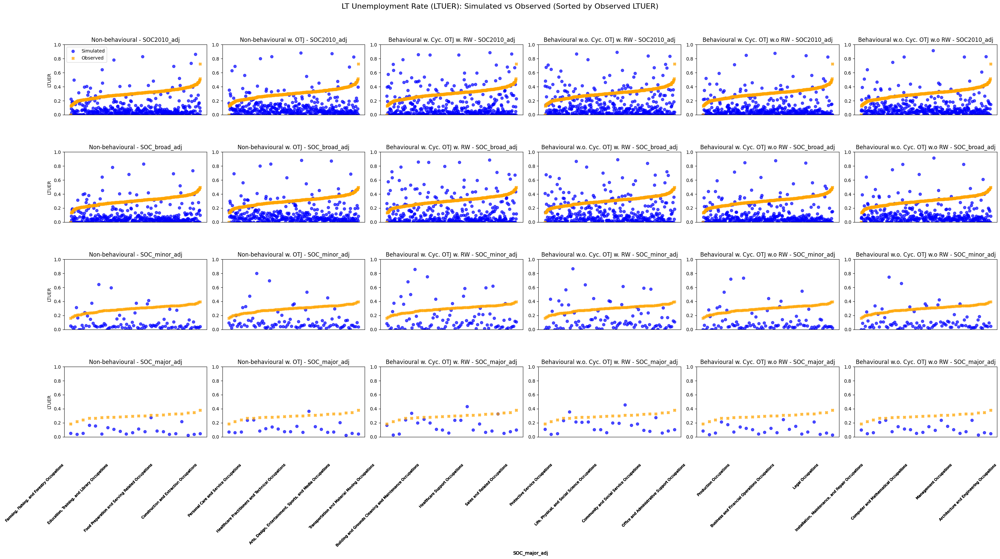

In [34]:
# Example usage:
# occ_ltuers = pd.read_csv(path+"data/highlev_occ_ltuers.csv")
# occ_ltuers = occ_ltuers.groupby('occupation')['ltuer'].mean().reset_index()
# Pasted from data/occ_macro_vars/CPS_LTUER/occ_ltuer_observed.csv
occ_ltuer_obs = pd.read_csv(path + "data/occ_uer_ltuer_observed.csv",
    dtype={
            'SOC_major_adj': str,
            'SOC_minor_adj': str,
            'SOC_broad_adj': str,
            'SOC2010_adj': str,
        }
    )

soc_labs = pd.read_csv('/Users/ebbamark/Documents/Documents - Nuff-Malham/GitHub/transition_abm//data/occ_macro_vars/OEWS/soc_major_labels.csv', dtype={"soc_code": str})

plot_occupation_uer_grid2(filtered_sim_results, occ_ltuer_obs, soc_labs, save=save_button, path=output_path)

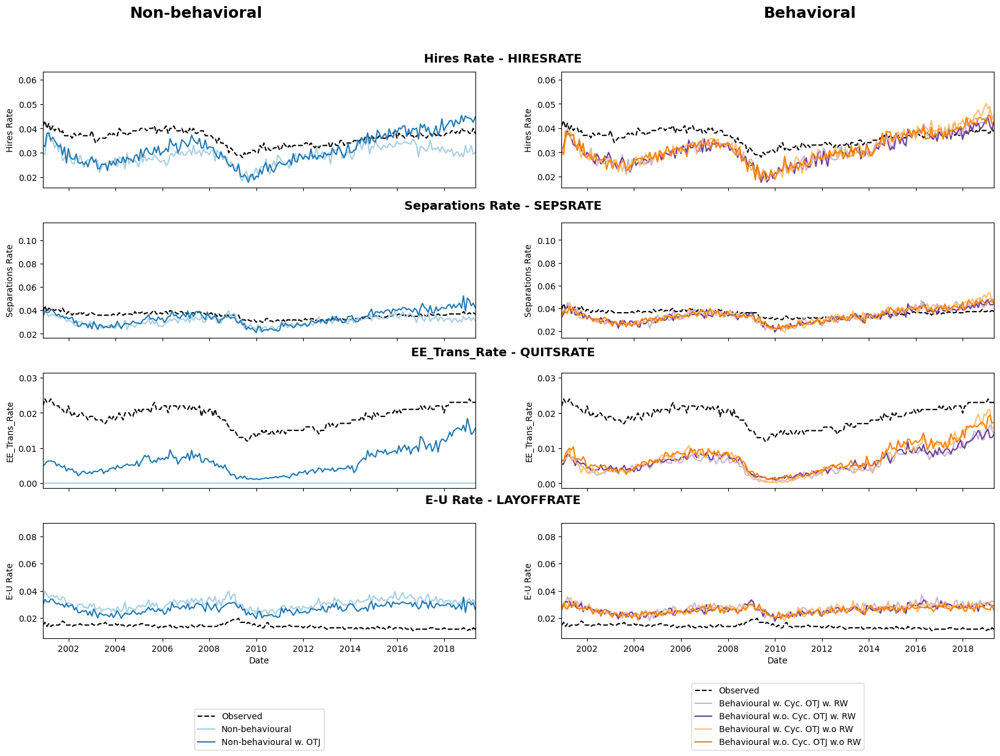

In [35]:
hires_seps_rate(filtered_model_results, jolts = jolts, save = save_button, path = output_path, colors = plot_colors)


In [36]:
# plot_occupation_vr_grid(filtered_sim_results, occ_ltuer_obs, soc_labs, save=save_button, path=output_path)


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/matplotlib/colors.py:2294: RuntimeWarning: invalid value encountered in subtract
  resdat -= vmin
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/matplotlib/colors.py:2295: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)


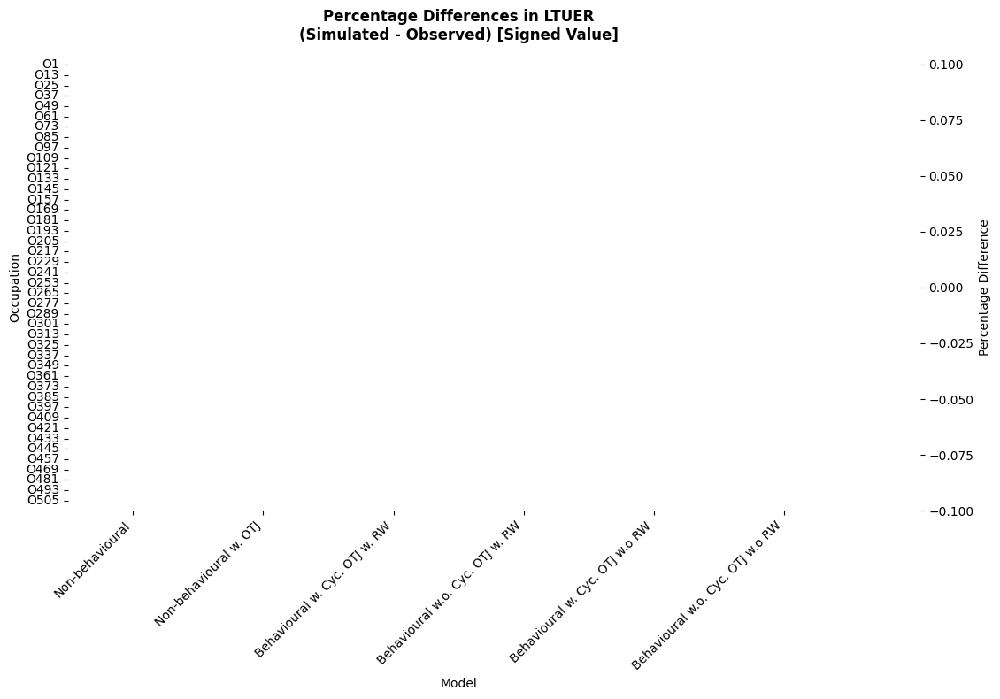

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/matplotlib/colors.py:2295: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)


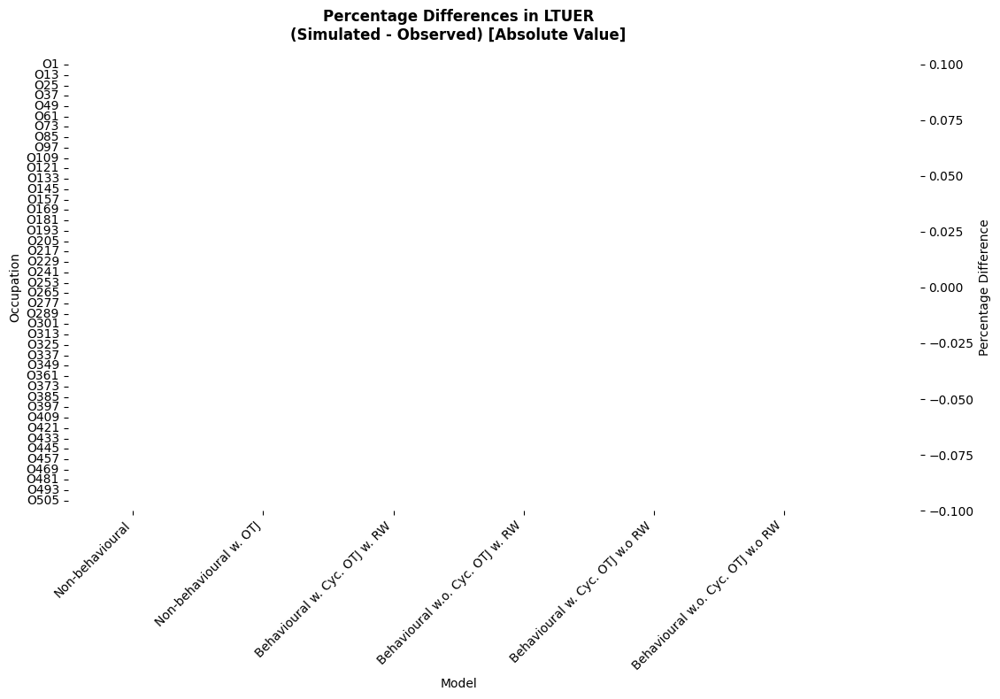

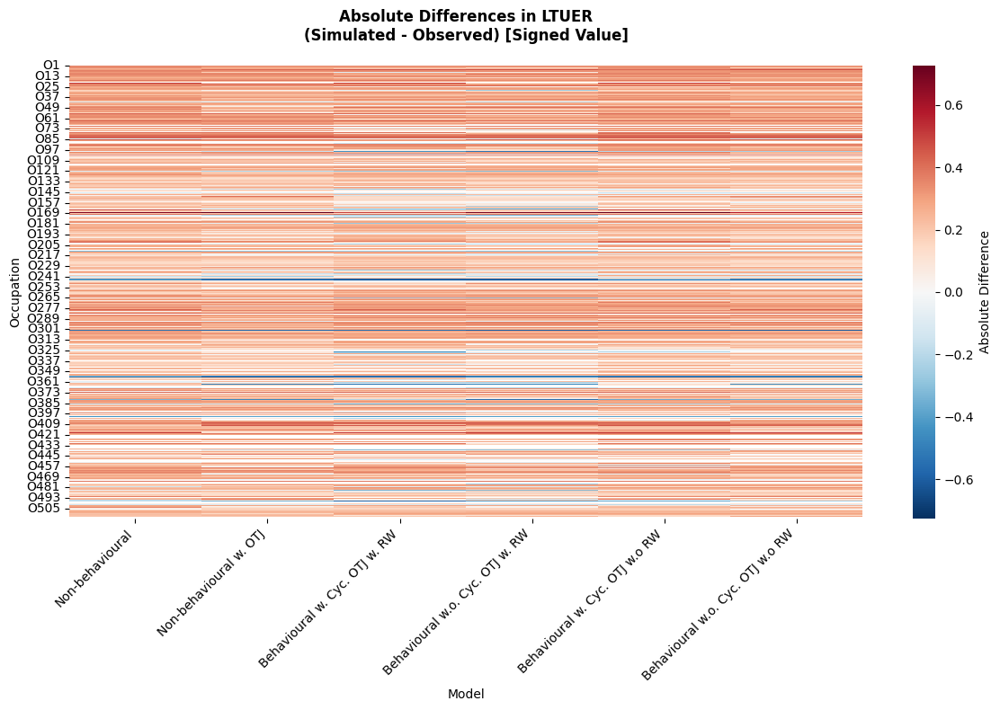

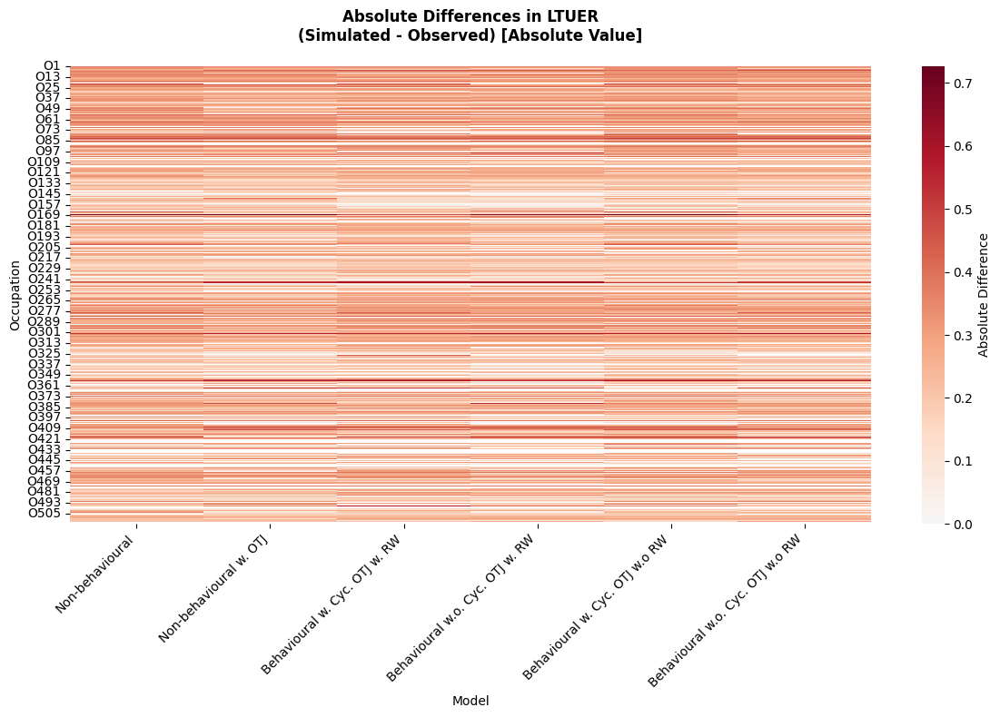

In [37]:
for i in {'absolute', 'percentage'}:
    for j in {True, False}:
         plot_ltuer_difference_heatmap(filtered_sim_results, occ_ltuer_obs, difference_type = i, abs_value = j, save=save_button, path=output_path)

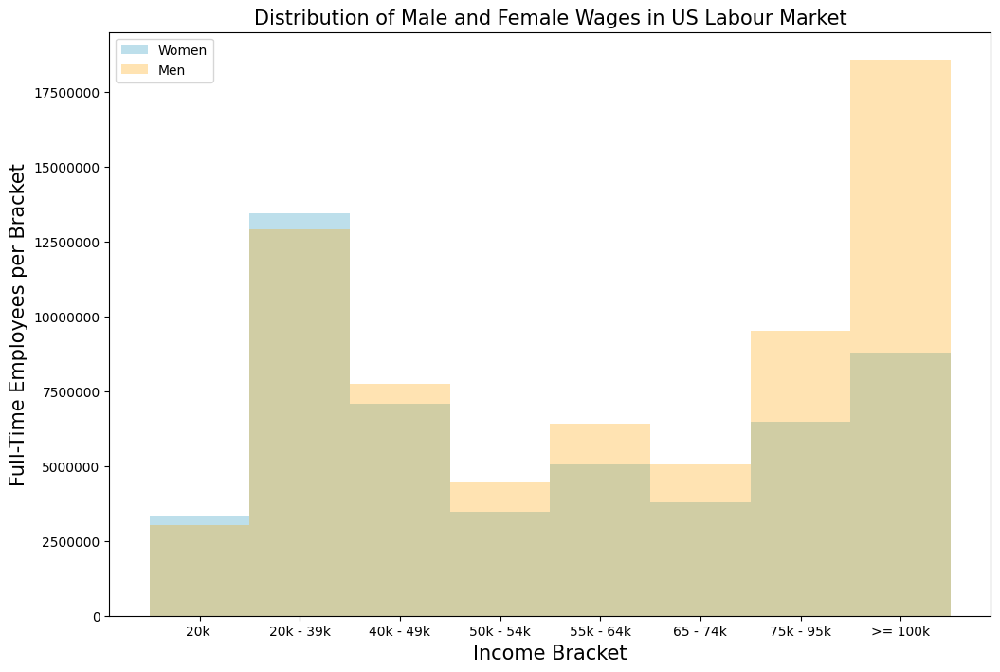

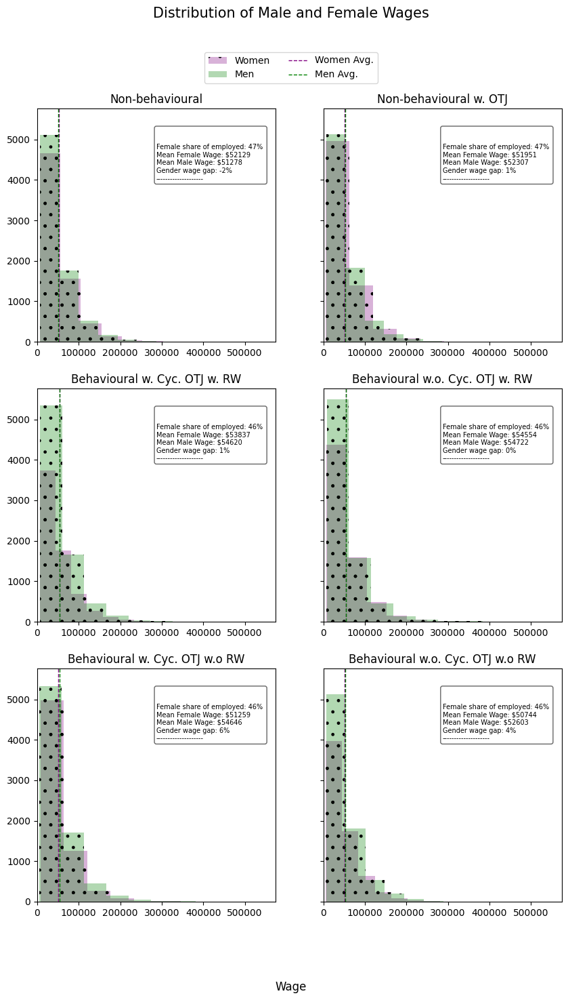

In [38]:
gender_income = pd.read_csv(path+"data/gender_income_distribution_usa_2022.csv", delimiter=',', thousands = ",")

gender_income['Income Bracket'] = gender_income['Income Bracket'].str.replace(' or loss', '')
gender_income['Income Bracket'] = gender_income['Income Bracket'].str.replace(' or more', '')
gender_income['Ceiling'] = gender_income['Income Bracket'].str[-7:]
gender_income['Ceiling'] = gender_income['Ceiling'].str.replace(',', '')
gender_income['Ceiling'] = gender_income['Ceiling'].str.replace('$', '')
gender_income['Ceiling'] = gender_income['Ceiling'].str.replace(' ', '')
gender_income['Ceiling'] = gender_income['Ceiling'].astype('Int64')
gender_income.loc[0:7, 'Bracket'] = "20k "
gender_income.loc[8:12, 'Bracket'] = "20k - 39k"
gender_income.loc[13:14, 'Bracket'] = "40k - 49k"
gender_income.loc[15, 'Bracket'] = "50k - 54k"
gender_income.loc[16, 'Bracket'] = "55k - 64k"
gender_income.loc[17, 'Bracket'] = "65 - 74k"
gender_income.loc[18, 'Bracket'] = "75k - 95k"
gender_income.loc[19, 'Bracket'] = ">= 100k"
brackets = gender_income.groupby(['Bracket']).sum().reset_index()

barWidth = 1
fig = plt.subplots(figsize =(12, 8)) 
br1 = np.arange(len(brackets['Bracket'])) + 1
br2 = br1
 
############## GENDER WAGE GAPS ####################
####################################################
def plot_gender_gaps(net_dict, sep = False, save = False, path = None):
    """
    Function to plot the gender wage disttribution across models
    """
    n = len(net_dict)
    if sep:
        cols = 2
    else:
        max_cols = 2
        cols = min(n, max_cols)
        
    rows = math.ceil(n / cols)

    # Find the global max wage across all models
    global_max_wage = 0
    for net in net_dict.values():
        for occ in net:
            w_wages = [wrkr.wage for wrkr in occ.list_of_employed if wrkr.female]
            m_wages = [wrkr.wage for wrkr in occ.list_of_employed if not(wrkr.female)]
            max_wage = max(w_wages + m_wages) if (w_wages + m_wages) else 0
            if max_wage > global_max_wage:
                global_max_wage = max_wage

    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows), squeeze=False, sharey = True)
    axes = axes.flatten()  # Flatten to make indexing easy

    for i, (name, net) in enumerate(net_dict.items()):
        ax = axes[i]
        emp_counter = 0
        women = 0
        men = 0

        w_wages = []
        m_wages = []

        w_wage = 0
        m_wage = 0

        for occ in net:
            emp_counter += len(occ.list_of_employed)
            women += len([wrkr for wrkr in occ.list_of_employed if wrkr.female])
            men += len([wrkr for wrkr in occ.list_of_employed if not(wrkr.female)])
            w_wages.extend([wrkr.wage for wrkr in occ.list_of_employed if wrkr.female])
            m_wages.extend([wrkr.wage for wrkr in occ.list_of_employed if not(wrkr.female)])
            w_wage += np.nansum([wrkr.wage for wrkr in occ.list_of_employed if wrkr.female])
            m_wage += np.nansum([wrkr.wage for wrkr in occ.list_of_employed if not wrkr.female])


        women_arr = np.array(w_wages, dtype=float)
        men_arr = np.array(m_wages, dtype=float)
        # Count NaNs
        num_nan_women = np.isnan(women_arr).sum()
        num_nan_men = np.isnan(men_arr).sum()

        # Print warnings if any are found
        if num_nan_women > 0:
            print(f"{num_nan_women} NA value(s) found in women's wages for '{name}' — ignored in calculations.")
        if num_nan_men > 0:
            print(f"{num_nan_men} NA value(s) found in men's wages for '{name}' — ignored in calculations.")

        t= " \n" + " \n" +  "Female share of employed: " + str(round((women/emp_counter)*100)) + "% \n" + "Mean Female Wage: $" + str(round(w_wage/women)) + "\n" + "Mean Male Wage: $" + str(round(m_wage/men)) + "\n" + "Gender wage gap: " + str(round(100*(1 - (w_wage/women)/(m_wage/men)))) + "%" + "\n" + "--------------------"

        n_bins = 10
        women_arr = np.array(w_wages)
        men_arr = np.array(m_wages)

        # We can set the number of bins with the *bins* keyword argument.
        ax.hist(women_arr, bins=n_bins, alpha = 0.3, color = 'purple', label = 'Women', fill = True, hatch = '.')
        ax.hist(men_arr, bins=n_bins, alpha = 0.3, label = 'Men', color = 'green', fill = True, hatch = '.')  
        ax.axvline(np.nanmean(women_arr), color='purple', linestyle='dashed', linewidth=1, label = 'Women Avg.')
        ax.axvline(np.nanmean(men_arr), color='green', linestyle='dashed', linewidth=1, label = 'Men Avg.')
        #ax.legend(loc='upper right') 
        ax.annotate(
                t,
                xy=(0.5, 0.8),
                xycoords='axes fraction',
                fontsize=7,
                verticalalignment='center',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.6)
            )
        ax.set_title(name)
        ax.set_xlim([0, global_max_wage])
        if i == 0:
            handles, labels = ax.get_legend_handles_labels()

    fig.supxlabel("Wage")  # Shared x-axis label
    fig.suptitle('Distribution of Male and Female Wages', fontsize = 15) 
    fig.subplots_adjust(bottom=0.1)
    # Add single legend below the title, above the plots
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.94), 
               ncol=2, frameon=True, fontsize=10)


    if save:
        plt.savefig(f'{path}gender_wage_gaps.jpg', dpi = 300)
    plt.show()


# Make the plot
plt.bar(br1, brackets['Full-Time Females'], color ='lightblue', width = barWidth, alpha = 0.8,
         label ='Women') 
plt.bar(br2, brackets['Full-Time Males'], color ='orange', width = barWidth, alpha = 0.3,
        label ='Men') 

# Adding Xticks 
plt.xlabel('Income Bracket', fontsize = 15) 
plt.ylabel('Full-Time Employees per Bracket', fontsize = 15) 
plt.ticklabel_format(useOffset=False, style='plain')
plt.xticks([r + barWidth for r in range(len(brackets['Bracket']))], 
        brackets['Bracket'])

plt.title('Distribution of Male and Female Wages in US Labour Market', fontsize = 15) 
plt.legend()
plt.show() 

womens_wage = (gender_income['Ceiling'] * gender_income['Full-Time Females']).sum()/(gender_income['Full-Time Females'].sum())
mens_wage = (gender_income['Ceiling'] * gender_income['Full-Time Males']).sum()/(gender_income['Full-Time Males'].sum())

plot_gender_gaps(filtered_net_results, save = True, path = output_path)


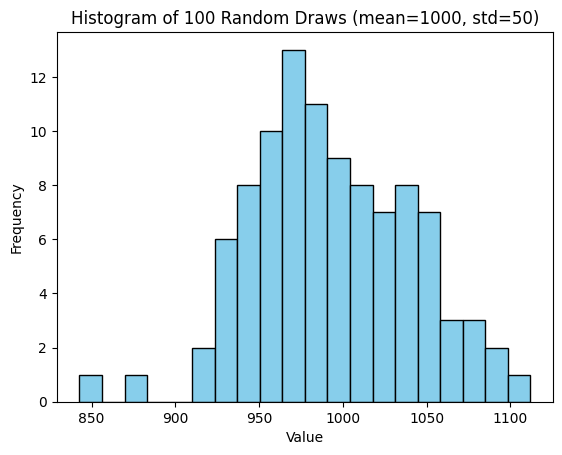

In [39]:
samples = np.random.normal(1000, 0.05*1000, size=100)
plt.hist(samples, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of 100 Random Draws (mean=1000, std=50)')
plt.show()

,Time Step,Unemployment,U_inflow,U_outflow,ΔU,Residual,UER,VACRATE
212,237,449,438,443,-27.0,-22.0,0.029937,0.046717
213,238,467,465,414,18.0,-33.0,0.031158,0.045676
214,239,443,440,433,-24.0,-31.0,0.029551,0.045970
215,240,518,508,409,75.0,-24.0,0.034543,0.051494
216,241,478,466,478,-40.0,-28.0,0.031877,0.049499
217,242,482,476,436,4.0,-36.0,0.032165,0.050478
218,243,511,499,443,29.0,-27.0,0.034083,0.051107
219,244,450,454,478,-61.0,-37.0,0.030034,0.046891
220,245,472,490,426,22.0,-42.0,0.031513,0.049161
221,246,463,452,437,-9.0,-24.0,0.030875,0.048950


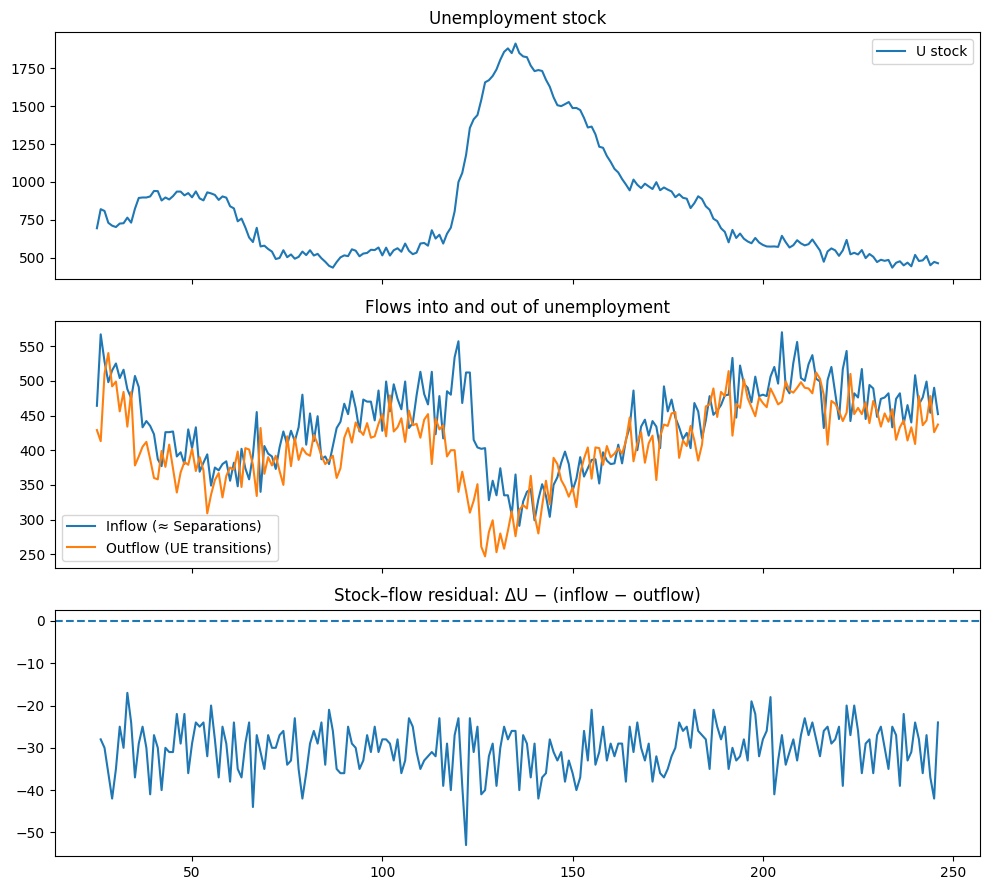

In [40]:
from statsmodels.api import OLS, add_constant

def stock_flow_diagnostics(grouped):
    """
    grouped: model_fun returns (time-aggregated) dataframe with at least:
      ['Time Step','Unemployment','Employment','Hires','Separations',
       'UE_Transitions','EE_Transitions','Vacancies','Workers','UER','VACRATE']
    """
    g = grouped.copy()

    # Infer what we can if a few columns are missing
    if 'UER' not in g and {'Unemployment','Workers'} <= set(g):
        g['UER'] = g['Unemployment'] / g['Workers']
    if 'VACRATE' not in g and {'Vacancies','Employment'} <= set(g):
        g['VACRATE'] = g['Vacancies'] / (g['Vacancies'] + g['Employment'])

    # Inflow to U ≈ separations from E (you can add other inflows if present)
    g['U_inflow']  = g.get('Separations', pd.Series(0, index=g.index))

    # Outflow from U ≈ hires coming from U (UE transitions)
    g['U_outflow'] = g.get('UE_Transitions', pd.Series(0, index=g.index))

    # Stock-flow identity residual (should hover around 0, drift shows up here)
    g['ΔU'] = g['Unemployment'].diff()
    g['Residual'] = g['ΔU'] - (g['U_inflow'] - g['U_outflow'])

    fig, axs = plt.subplots(3, 1, figsize=(10, 9), sharex=True)
    axs[0].plot(g['Time Step'], g['Unemployment'], label='U stock')
    axs[0].set_title('Unemployment stock')
    axs[0].legend()

    axs[1].plot(g['Time Step'], g['U_inflow'], label='Inflow (≈ Separations)')
    axs[1].plot(g['Time Step'], g['U_outflow'], label='Outflow (UE transitions)')
    axs[1].set_title('Flows into and out of unemployment')
    axs[1].legend()

    axs[2].plot(g['Time Step'], g['Residual'])
    axs[2].axhline(0, ls='--')
    axs[2].set_title('Stock–flow residual: ΔU − (inflow − outflow)')
    plt.tight_layout()
    return g[['Time Step','Unemployment','U_inflow','U_outflow','ΔU','Residual','UER','VACRATE']]


sf_table = stock_flow_diagnostics(filtered_model_results['Non-behavioural'])
sf_table.tail(10)

,Time Step,Share_hires_to_U,Share_hires_to_E,Tightness
212,237,1.0,0.0,1.587973
213,238,1.0,0.0,1.488223
214,239,1.0,0.0,1.582393
215,240,1.0,0.0,1.517375
216,241,1.0,0.0,1.581590
217,242,1.0,0.0,1.599585
218,243,1.0,0.0,1.526419
219,244,1.0,0.0,1.588889
220,245,1.0,0.0,1.588983
221,246,1.0,0.0,1.615551


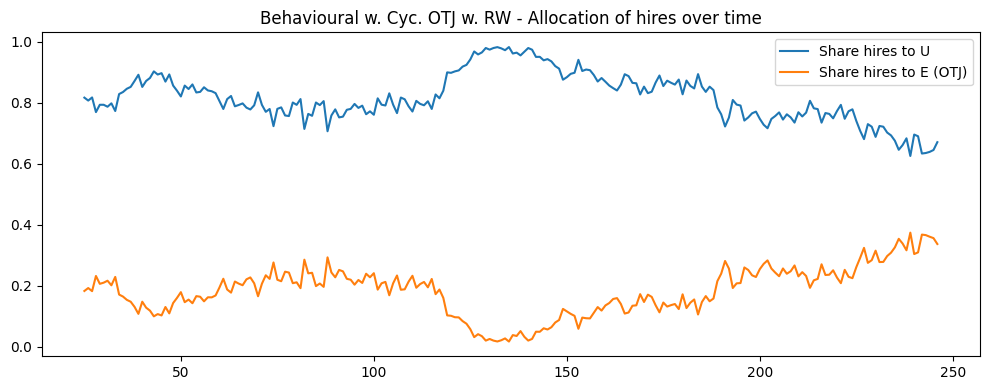

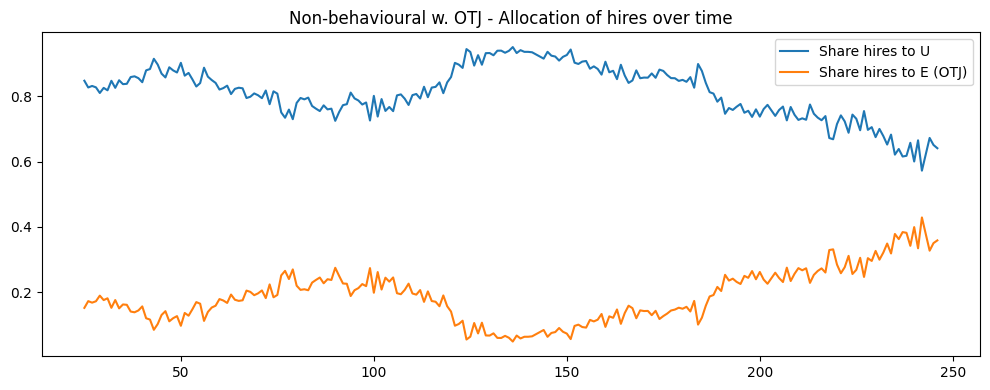

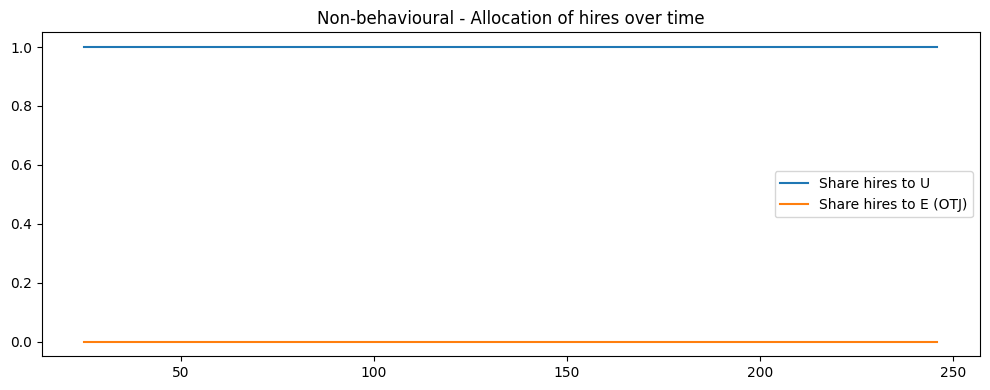

In [41]:
def crowdout_diagnostics(grouped, name):
    g = grouped[name].copy()
    hires = g.get('Hires', g.get('UE_Transitions', 0) + g.get('EE_Transitions', 0))
    g['Share_hires_to_U'] = g.get('UE_Transitions', 0) / hires.replace(0, np.nan)
    g['Share_hires_to_E'] = g.get('EE_Transitions', 0) / hires.replace(0, np.nan)
    g['Tightness'] = g.get('Vacancies', 0) / g.get('Unemployment', 1).replace(0, np.nan)

    fig, ax = plt.subplots(1,1, figsize=(10,4))
    ax.plot(g['Time Step'], g['Share_hires_to_U'], label='Share hires to U')
    ax.plot(g['Time Step'], g['Share_hires_to_E'], label='Share hires to E (OTJ)')
    ax.set_title(f'{name} - Allocation of hires over time')
    ax.legend()
    plt.tight_layout()

    return g[['Time Step','Share_hires_to_U','Share_hires_to_E','Tightness']]

crowd_table = crowdout_diagnostics(filtered_model_results, 'Behavioural w. Cyc. OTJ w. RW')
#crowd_table = crowdout_diagnostics(filtered_model_results, 'Behavioural w.o. Cyc. OTJ w.o RW')
crowd_table = crowdout_diagnostics(filtered_model_results, 'Non-behavioural w. OTJ')
crowd_table = crowdout_diagnostics(filtered_model_results, 'Non-behavioural')
crowd_table.tail(10)

,Time Step,Unemployment,UE_Transitions,Vacancies,Employment,Unemployed Seekers,Applications Sent (Unemployed),OpenVacs,TotalApplicants,MeanAppsPerVac,MedianAppsPerVac,apps_per_U,exit_rate_U,success_per_app_U,apps_per_vac_total,tightness
42353,246,678,420,689,14318,661,4182,1,5,5.000000,5.0,6.168142,0.619469,0.10043,5.000000,NaN
42354,246,678,420,689,14318,661,4182,1,4,4.000000,4.0,6.168142,0.619469,0.10043,4.000000,NaN
42355,246,678,420,689,14318,661,4182,1,1,1.000000,1.0,6.168142,0.619469,0.10043,1.000000,NaN
42356,246,678,420,689,14318,661,4182,1,1,1.000000,1.0,6.168142,0.619469,0.10043,1.000000,NaN
42357,246,678,420,689,14318,661,4182,1,5,5.000000,5.0,6.168142,0.619469,0.10043,5.000000,NaN
42358,246,678,420,689,14318,661,4182,1,9,9.000000,9.0,6.168142,0.619469,0.10043,9.000000,NaN
42359,246,678,420,689,14318,661,4182,3,5,1.666667,2.0,6.168142,0.619469,0.10043,1.666667,NaN
42360,246,678,420,689,14318,661,4182,11,118,10.727273,9.0,6.168142,0.619469,0.10043,10.727273,NaN
42361,246,678,420,689,14318,661,4182,1,2,2.000000,2.0,6.168142,0.619469,0.10043,2.000000,NaN
42362,246,678,420,689,14318,661,4182,1,0,0.000000,0.0,6.168142,0.619469,0.10043,0.000000,NaN


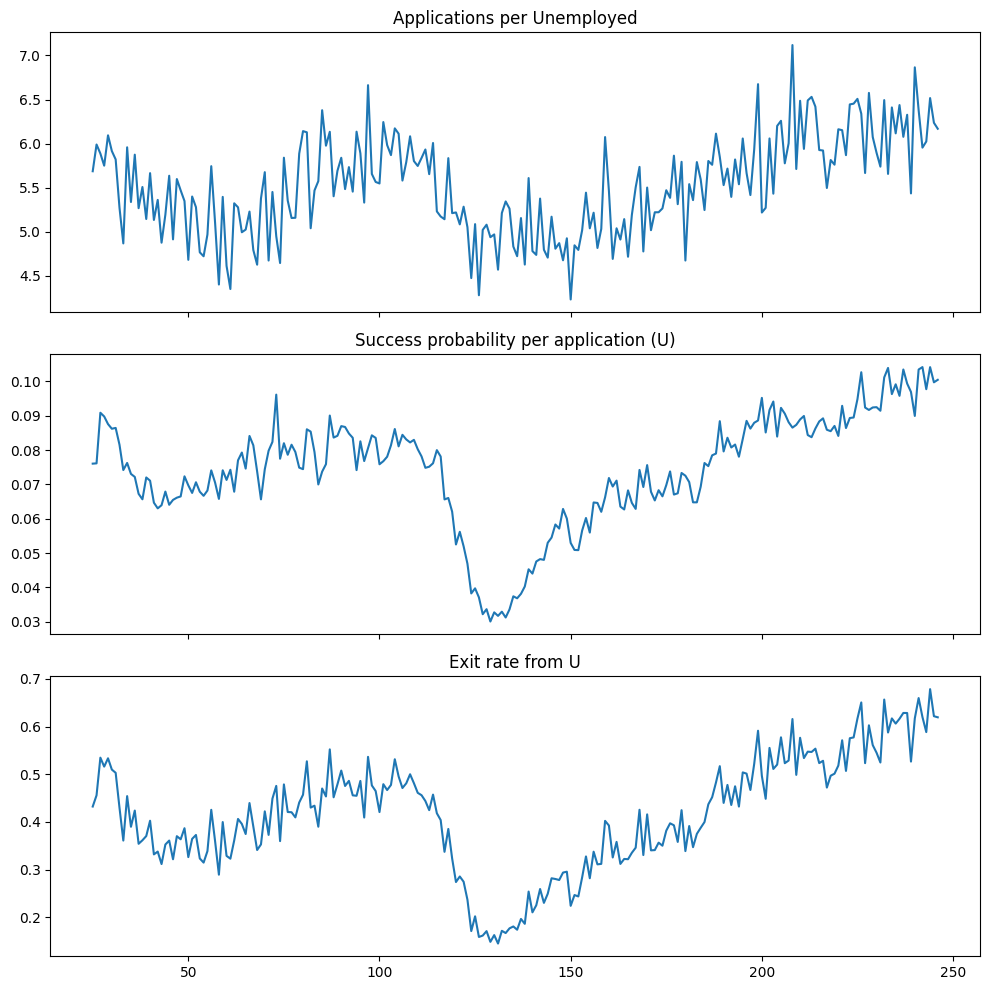

In [42]:
def outflow_decomposition(grouped, seekers_rec, app_load_df):
    g = grouped[['Time Step','Unemployment','UE_Transitions','Vacancies','Employment']].copy()
    s = seekers_rec.copy()
    a = app_load_df.copy()

    # Expected column names in seekers_rec:
    # ['Time Step','Unemployed Seekers','Applications Sent (Unemployed)',
    #  'Employed Seekers','Applications Sent (Employed)']
    sU = s.get('Unemployed Seekers', pd.Series(index=s.index, dtype=float))
    sUa = s.get('Applications Sent (Unemployed)', pd.Series(index=s.index, dtype=float))

    m = g.merge(s[['Time Step', 'Unemployed Seekers','Applications Sent (Unemployed)']],
                on='Time Step', how='left')
    m = m.merge(a[['Time Step','OpenVacs','TotalApplicants','MeanAppsPerVac','MedianAppsPerVac']],
                on='Time Step', how='left')

    # Application intensity (per unemployed)
    m['apps_per_U'] = m['Applications Sent (Unemployed)'] / m['Unemployment'].replace(0, np.nan)

    # Match (exit) rate out of U
    m['exit_rate_U'] = m['UE_Transitions'] / m['Unemployment'].replace(0, np.nan)

    # Hire-per-application rate for U (acceptance/success probability)
    m['success_per_app_U'] = m['UE_Transitions'] / m['Applications Sent (Unemployed)'].replace(0, np.nan)

    # Tightness measures
    m['apps_per_vac_total'] = m['TotalApplicants'] / m['OpenVacs'].replace(0, np.nan)
    m['tightness'] = g['Vacancies'] / g['Unemployment'].replace(0, np.nan)

    # Plots
    fig, axs = plt.subplots(3,1, figsize=(10,10), sharex=True)
    axs[0].plot(m['Time Step'], m['apps_per_U']); axs[0].set_title('Applications per Unemployed')
    axs[1].plot(m['Time Step'], m['success_per_app_U']); axs[1].set_title('Success probability per application (U)')
    axs[2].plot(m['Time Step'], m['exit_rate_U']); axs[2].set_title('Exit rate from U')
    plt.tight_layout()
    return m

decomp = outflow_decomposition(filtered_model_results['Behavioural w. Cyc. OTJ w. RW'], seekers_recs['Behavioural w. Cyc. OTJ w. RW'], filtered_app_loads['Behavioural w. Cyc. OTJ w. RW'])
decomp.tail(10)

                            OLS Regression Results                            
Dep. Variable:                    UER   R-squared:                       0.580
Model:                            OLS   Adj. R-squared:                  0.574
Method:                 Least Squares   F-statistic:                     29.53
Date:                Tue, 13 Jan 2026   Prob (F-statistic):           4.63e-16
Time:                        19:04:39   Log-Likelihood:                 704.42
No. Observations:                 222   AIC:                            -1401.
Df Residuals:                     218   BIC:                            -1387.
Df Model:                           3                                         
Covariance Type:                  HAC                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1238      0.019      6.391      0.0

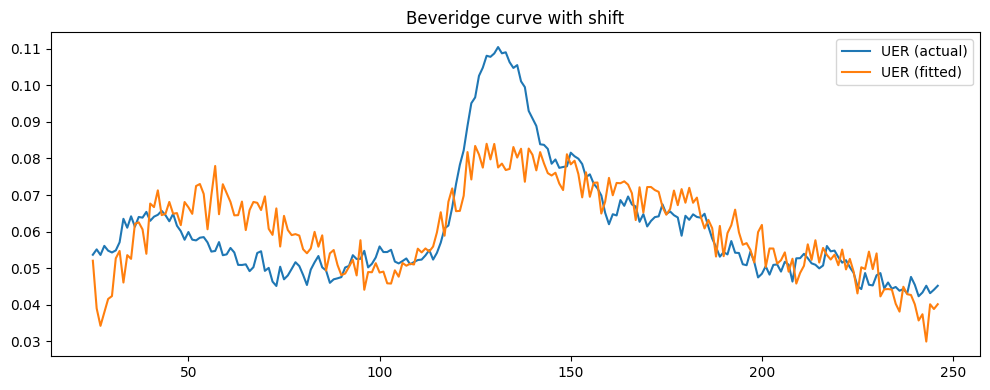

In [43]:
def beveridge_shift_test(grouped, cutoff_step=None):
    g = grouped[['Time Step','UER','VACRATE']].dropna().copy()
    if cutoff_step is None:
        # Example: split around 2013 if your time index maps that way; else use median step
        cutoff_step = int(g['Time Step'].median())
    g['post'] = (g['Time Step'] >= cutoff_step).astype(int)
    g['post_x_vac'] = g['post'] * g['VACRATE']

    X = add_constant(g[['VACRATE','post','post_x_vac']])
    y = g['UER']
    res = OLS(y, X).fit(cov_type='HAC', cov_kwds={'maxlags':3})
    print(res.summary().as_text())

    # Visual: fitted vs actual
    g['fitted'] = res.predict(X)
    plt.figure(figsize=(10,4))
    plt.plot(g['Time Step'], g['UER'], label='UER (actual)')
    plt.plot(g['Time Step'], g['fitted'], label='UER (fitted)')
    plt.title('Beveridge curve with shift')
    plt.legend(); plt.tight_layout()
    return res, g

bev_res, bev_df = beveridge_shift_test(filtered_model_results['Behavioural w. Cyc. OTJ w. RW'])

,Time Step,UE_exits,mean_d,median_d,p90_d
236,237,418,2.150718,1.0,3.0
237,238,406,1.800493,1.0,3.0
238,239,376,1.912234,1.0,3.0
239,240,421,1.755344,1.0,2.0
240,241,419,1.773270,1.0,3.0
241,242,402,1.624378,1.0,3.0
242,243,398,1.600503,1.0,3.0
243,244,439,1.961276,1.0,2.2
244,245,410,1.936585,1.0,2.0
245,246,415,1.477108,1.0,2.0


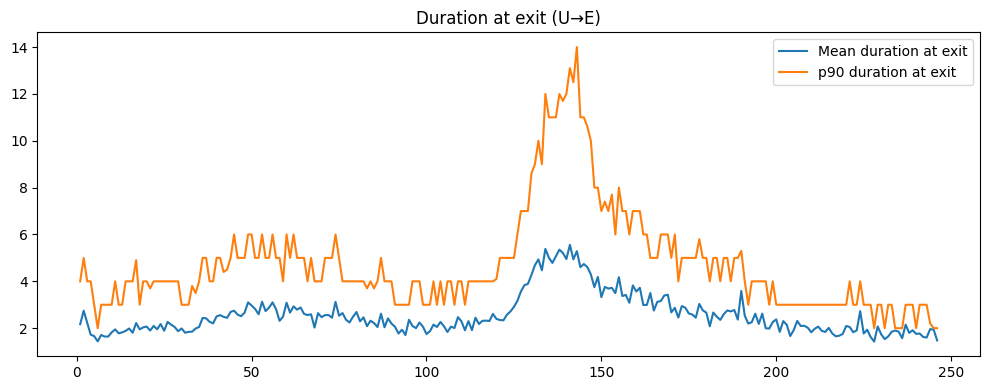

In [44]:
def duration_at_exit(ue_spell_origin_df):
    if ue_spell_origin_df is None or ue_spell_origin_df.empty:
        print("ue_spell_origin_df is empty—enable UE spell recording in model_fun to use this.")
        return None
    d = ue_spell_origin_df.copy()
    d = d.dropna(subset=['UEDuration'])
    by_t = d.groupby('Time Step')['UEDuration'].agg(['count','mean','median',lambda x: x.quantile(0.9)]).reset_index()
    by_t.columns = ['Time Step','UE_exits','mean_d','median_d','p90_d']

    fig, ax = plt.subplots(1,1, figsize=(10,4))
    ax.plot(by_t['Time Step'], by_t['mean_d'], label='Mean duration at exit')
    ax.plot(by_t['Time Step'], by_t['p90_d'], label='p90 duration at exit')
    ax.set_title('Duration at exit (U→E)')
    ax.legend(); plt.tight_layout()
    return by_t

dur_exit = duration_at_exit(time_to_emps['otj_cyclical_e_disc'])
dur_exit.tail(10) if dur_exit is not None else None

,Time Step,tightness,share_to_U
212,237,0.971429,0.661392
213,238,1.029412,0.683502
214,239,0.929972,0.625624
215,240,1.010264,0.695868
216,241,1.152756,0.690280
217,242,1.100000,0.633648
218,243,1.154867,0.635350
219,244,1.066461,0.639010
220,245,1.060514,0.645212
221,246,1.016224,0.670927


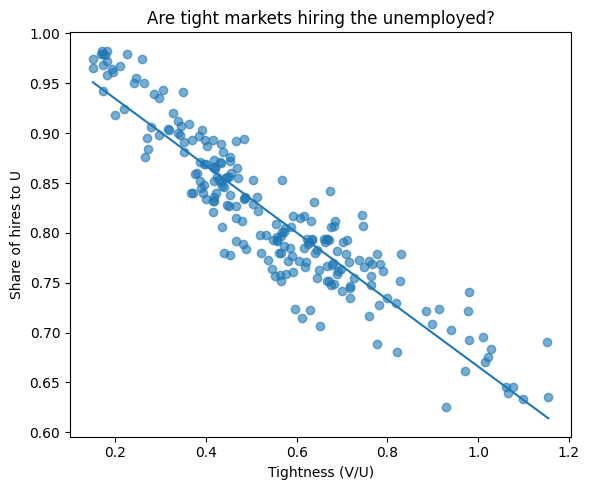

In [45]:
def allocation_vs_tightness(grouped):
    g = grouped.copy()
    g['tightness'] = g['Vacancies'] / g['Unemployment'].replace(0, np.nan)
    hires = g.get('Hires', g.get('UE_Transitions', 0) + g.get('EE_Transitions', 0))
    g['share_to_U'] = g.get('UE_Transitions', 0) / hires.replace(0, np.nan)

    plt.figure(figsize=(6,5))
    plt.scatter(g['tightness'], g['share_to_U'], alpha=0.6)
    z = np.polyfit(g['tightness'].replace([np.inf, -np.inf], np.nan).dropna(),
                   g['share_to_U'].dropna(), 1)
    xline = np.linspace(g['tightness'].min(), g['tightness'].max(), 50)
    plt.plot(xline, z[0]*xline + z[1])
    plt.xlabel('Tightness (V/U)'); plt.ylabel('Share of hires to U')
    plt.title('Are tight markets hiring the unemployed?')
    plt.tight_layout()
    return g[['Time Step','tightness','share_to_U']]

alloc_tbl = allocation_vs_tightness(filtered_model_results['Behavioural w. Cyc. OTJ w. RW'])
alloc_tbl.tail(10)

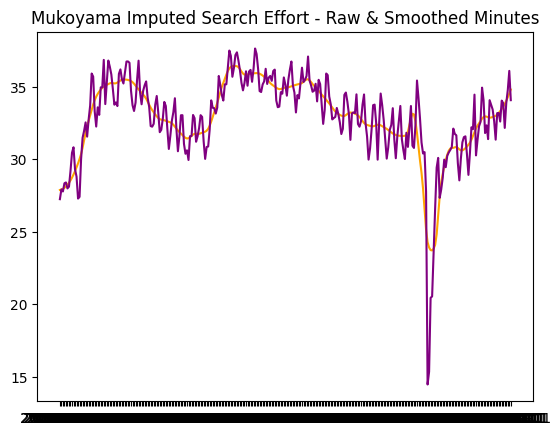

In [46]:
mukoyama_obs_full = pd.read_csv('../data/behav_params/Mukoyama_Replication/monthly_search_ts.csv')
mukoyama_obs_full['DATE'] = mukoyama_obs_full['year'].astype(str) + "-" + mukoyama_obs_full['month'].astype(str).str.zfill(2)  + "-01"

mukoyama_obs = mukoyama_obs_full[(mukoyama_obs_full['DATE'] >= calib_date[0]) & (mukoyama_obs_full['DATE'] <= calib_date[1])]
mukoyama_obs = mukoyama_obs.rename(columns={"value_smooth": "Application Effort (U)"})
mukoyama_obs['DATE'] = pd.to_datetime(mukoyama_obs['DATE'])

plt.plot(mukoyama_obs_full['DATE'], mukoyama_obs_full['value_smooth'], linestyle='-', color='orange', label="Observed Search Effort - Smoothed")
plt.plot(mukoyama_obs_full['DATE'], mukoyama_obs_full['value'], linestyle='-', color='purple', label="Observed Search Effort - Raw")
plt.title("Mukoyama Imputed Search Effort - Raw & Smoothed Minutes")
plt.show()


In [47]:
comp_series = observation
print(observation)
jolts_obs = jolts[(jolts['DATE'] >= calib_date[0]) & (jolts['DATE'] <= calib_date[1])].reset_index()
jolts_obs = jolts_obs.rename(columns={"HIRESRATE": "Hires Rate", "SEPSRATE": "Separations Rate"})
all_rates_new = all_rates_new.rename(columns={"UE": "UE_Trans_Rate", "EE": "EE_Trans_Rate"})
comp_series = comp_series.merge(jolts_obs, on='DATE', how='left')
comp_series = comp_series.merge(all_rates_new, on = 'DATE')
comp_series = comp_series.merge(mukoyama_obs, on = 'DATE')
comp_series = comp_series.merge(seekers_comp_obs, on = 'DATE', how = 'left')
print(comp_series)

def compute_time_series_metrics(res_dict, seekers_info_dict, obs_dict, variables):
    rows = []
    for model_name, sim_df in res_dict.items():
        for var in variables:
            if var == "Application Effort (U)":
                sim_series = seekers_info_dict[model_name][var].values if var in seekers_info_dict[model_name] else None
            else:
                sim_series = sim_df[var].values if var in sim_df else None
            obs_series = obs_dict[var].values if var in obs_dict else None
            if sim_series is None or obs_series is None or len(sim_series) != len(obs_series):
                print(len(sim_series))
                print(len(obs_series))
                #continue
                raise KeyError(f"Missing or mismatched data for {var} in {model_name}")
            if var == "Application Effort (U)":
                # Only keep correlation
                row = {
                    'Model': model_name,
                    'Variable': var,
                    'Correlation': round(float(np.corrcoef(sim_series, obs_series)[0, 1]), 3)
                }
            else:
                # Full set of metrics
                row = {
                    'Model': model_name,
                    'Variable': var,
                    'Mean (Sim)': round(float(np.mean(sim_series)), 3),
                    'Mean (Obs)': round(float(np.mean(obs_series)), 3),
                    #'Variance (Sim)': round(float(np.var(sim_series)), 3),
                    #'Variance (Obs)': round(float(np.var(obs_series)), 3),
                    'SSE': round(float(np.sum((sim_series - obs_series) ** 2)), 3),
                    'Correlation': round(float(np.corrcoef(sim_series, obs_series)[0, 1]), 3)
                }

            rows.append(row)
    return pd.DataFrame(rows)

BEST_COLOR = "yellow!25"
EXCELLENT_COLOR = "red!25"

def _fmt_num(x):
    return "--" if pd.isna(x) else f"{x:.3f}"

def _color_val(x, color=BEST_COLOR):
    return "--" if pd.isna(x) else f"\\cellcolor{{{color}}}{x:.3f}"

def highlight_best(df: pd.DataFrame, threshold_pct=0.05) -> pd.DataFrame:
    """
    Highlight cells with two-tier coloring:
    - RED: Best value that outperforms second-best by more than threshold_pct
    - YELLOW: Values within threshold_pct of the best
    
    Parameters:
    -----------
    df : pd.DataFrame
        The metrics dataframe
    threshold_pct : float
        Percentage threshold (default 0.05 = 5%)
    """
    df = df.copy()

    # columns we may format
    metric_cols = [
        "Mean (Sim)", "Mean (Obs)",
        "Variance (Sim)", "Variance (Obs)",
        "SSE", "Correlation"
    ]

    # format all numeric cells first (as strings)
    for c in df.columns:
        if c in metric_cols:
            df[c] = df[c].apply(_fmt_num)

    # now compute winners per Variable and recolor
    for var in df["Variable"].unique():
        sub = df[df["Variable"] == var]

        # Mean difference -> color Mean (Sim) with smallest |Mean(Sim)-Mean(Obs)|
        if {"Mean (Sim)", "Mean (Obs)"}.issubset(sub.columns):
            mean_sim = pd.to_numeric(sub["Mean (Sim)"].replace("--", np.nan))
            mean_obs = pd.to_numeric(sub["Mean (Obs)"].replace("--", np.nan))
            diffs = (mean_sim - mean_obs).abs()
            
            valid_diffs = diffs.dropna()
            if not valid_diffs.empty and len(valid_diffs) >= 2:
                best_diff = valid_diffs.min()
                best_idx = valid_diffs.idxmin()
                second_best = valid_diffs.nsmallest(2).iloc[-1]
                
                # Check if best outperforms second-best by more than threshold
                is_excellent = second_best > best_diff * (1 + threshold_pct)
                
                # Color the best
                raw_val = mean_sim.loc[best_idx]
                df.loc[best_idx, "Mean (Sim)"] = _color_val(raw_val, EXCELLENT_COLOR if is_excellent else BEST_COLOR)
                
                # Color others within threshold (yellow only)
                threshold = best_diff * (1 + threshold_pct)
                for idx in valid_diffs.index:
                    if idx != best_idx and diffs.loc[idx] <= threshold:
                        raw_val = mean_sim.loc[idx]
                        df.loc[idx, "Mean (Sim)"] = _color_val(raw_val, BEST_COLOR)
            elif len(valid_diffs) == 1:
                # Only one value - make it yellow
                idx = valid_diffs.index[0]
                raw_val = mean_sim.loc[idx]
                df.loc[idx, "Mean (Sim)"] = _color_val(raw_val, BEST_COLOR)

        # Variance difference -> color Variance (Sim)
        if {"Variance (Sim)", "Variance (Obs)"}.issubset(sub.columns):
            var_sim = pd.to_numeric(sub["Variance (Sim)"].replace("--", np.nan))
            var_obs = pd.to_numeric(sub["Variance (Obs)"].replace("--", np.nan))
            diffs = (var_sim - var_obs).abs()
            
            valid_diffs = diffs.dropna()
            if not valid_diffs.empty and len(valid_diffs) >= 2:
                best_diff = valid_diffs.min()
                best_idx = valid_diffs.idxmin()
                second_best = valid_diffs.nsmallest(2).iloc[-1]
                
                is_excellent = second_best > best_diff * (1 + threshold_pct)
                
                raw_val = var_sim.loc[best_idx]
                df.loc[best_idx, "Variance (Sim)"] = _color_val(raw_val, EXCELLENT_COLOR if is_excellent else BEST_COLOR)
                
                threshold = best_diff * (1 + threshold_pct)
                for idx in valid_diffs.index:
                    if idx != best_idx and diffs.loc[idx] <= threshold:
                        raw_val = var_sim.loc[idx]
                        df.loc[idx, "Variance (Sim)"] = _color_val(raw_val, BEST_COLOR)
            elif len(valid_diffs) == 1:
                idx = valid_diffs.index[0]
                raw_val = var_sim.loc[idx]
                df.loc[idx, "Variance (Sim)"] = _color_val(raw_val, BEST_COLOR)

        # SSE -> lowest wins
        if "SSE" in sub.columns:
            sse = pd.to_numeric(sub["SSE"].replace("--", np.nan))
            valid_sse = sse.dropna()
            
            if not valid_sse.empty and len(valid_sse) >= 2:
                best_sse = valid_sse.min()
                best_idx = valid_sse.idxmin()
                second_best = valid_sse.nsmallest(2).iloc[-1]
                
                # Best is "excellent" if second-best is more than threshold% higher
                is_excellent = second_best > best_sse * (1 + threshold_pct)
                
                # Color the best
                raw_val = float(sse.loc[best_idx])
                df.loc[best_idx, "SSE"] = _color_val(raw_val, EXCELLENT_COLOR if is_excellent else BEST_COLOR)
                
                # Color others within threshold (yellow only)
                threshold = best_sse * (1 + threshold_pct)
                for idx in valid_sse.index:
                    if idx != best_idx and sse.loc[idx] <= threshold:
                        raw_val = float(sse.loc[idx])
                        df.loc[idx, "SSE"] = _color_val(raw_val, BEST_COLOR)
            elif len(valid_sse) == 1:
                idx = valid_sse.index[0]
                raw_val = float(sse.loc[idx])
                df.loc[idx, "SSE"] = _color_val(raw_val, BEST_COLOR)

        # Correlation -> highest wins
        if "Correlation" in sub.columns:
            corr = pd.to_numeric(sub["Correlation"].replace("--", np.nan))
            valid_corr = corr.dropna()
            
            if not valid_corr.empty and len(valid_corr) >= 2:
                best_corr = valid_corr.max()
                best_idx = valid_corr.idxmax()
                second_best = valid_corr.nlargest(2).iloc[-1]
                
                # Best is "excellent" if second-best is more than threshold% lower
                is_excellent = second_best < best_corr * (1 - threshold_pct)
                
                # Color the best
                raw_val = float(corr.loc[best_idx])
                df.loc[best_idx, "Correlation"] = _color_val(raw_val, EXCELLENT_COLOR if is_excellent else BEST_COLOR)
                
                # Color others within threshold (yellow only)
                threshold = best_corr * (1 - threshold_pct)
                for idx in valid_corr.index:
                    if idx != best_idx and corr.loc[idx] >= threshold:
                        raw_val = float(corr.loc[idx])
                        df.loc[idx, "Correlation"] = _color_val(raw_val, BEST_COLOR)
            elif len(valid_corr) == 1:
                idx = valid_corr.index[0]
                raw_val = float(corr.loc[idx])
                df.loc[idx, "Correlation"] = _color_val(raw_val, BEST_COLOR)

    return df

# ---- use it ----
ts_table = compute_time_series_metrics(
    filtered_model_results, seekers_recs, comp_series,
    ['VACRATE','UER','LTUER',"Hires Rate","Separations Rate",
     'UE_Trans_Rate','EE_Trans_Rate','Application Effort (U)','Seeker Composition']
)

# Map raw variable names to pretty/display names (minimal change)
var_display_map = {
    'VACRATE': 'Vacancy Rate',
    'UER': 'Unemployment Rate',
    'LTUER': 'Long-term Unemployment Rate',
    'Hires Rate': 'Hires Rate',
    'Separations Rate': 'Separations Rate',
    'UE_Trans_Rate': 'UE Transition Rate',
    'EE_Trans_Rate': 'EE Transition Rate',
    'Application Effort (U)': 'Application Effort (U)',  # keep or shorten to 'App Effort (U)'
    'Seeker Composition': 'Seeker Composition'
}

# apply the mapping (keeps original name if not found in map)
ts_table['Variable'] = ts_table['Variable'].map(var_display_map).fillna(ts_table['Variable'])

# Replace repeated model names with empty string after first occurrence per model
ts_table['Model'] = ts_table['Model'].where(~ts_table['Model'].duplicated(), '')

highlighted = highlight_best(ts_table)

save_button = True

if save_button:
    latex_table = highlighted.to_latex(
        index=False,
        escape=False,                 # required so \cellcolor works
        longtable=False,
        float_format="%.3f"
    )
    with open(f'{output_path}ts_metrics_table.tex', "w") as f:
        f.write("\\begin{table}[ht]\n")
        f.write("\\centering\n")
        f.write("\\begin{adjustbox}{width=\\textwidth}\n")
        f.write(latex_table)
        f.write("\\end{adjustbox}\n")
        f.write("\\end{table}\n")

    print(f"LaTeX table saved to {output_path}ts_metrics_table.tex")



     index       DATE  UNRATE    UER  FD_UNRATE  JTSJOR  VACRATE  FD_VACRATE  \
0      635 2000-12-01     3.9  0.039      0.000     3.7    0.037         NaN   
1      636 2001-01-01     4.2  0.042      0.003     3.8    0.038       0.001   
2      637 2001-02-01     4.2  0.042      0.000     3.7    0.037      -0.001   
3      638 2001-03-01     4.3  0.043      0.001     3.5    0.035      -0.002   
4      639 2001-04-01     4.4  0.044      0.001     3.4    0.034      -0.001   
..     ...        ...     ...    ...        ...     ...      ...         ...   
217    852 2019-01-01     4.0  0.040      0.001     4.8    0.048       0.000   
218    853 2019-02-01     3.8  0.038     -0.002     4.5    0.045      -0.003   
219    854 2019-03-01     3.8  0.038      0.000     4.6    0.046       0.001   
220    855 2019-04-01     3.7  0.037     -0.001     4.6    0.046       0.000   
221    856 2019-05-01     3.6  0.036     -0.001     4.6    0.046       0.000   

         GDPC1    REALGDP  FD_REALGDP  

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/var/folders/8b/bf75_lhn2ks3ff8jvrhctcvc0000gr/T/ipykernel_8769/3647253865.py:91: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  mean_sim = pd.to_numeric(sub["Mean (Sim)"].replace("--", np.nan))
/var/folders/8b/bf75_lhn2ks3ff8jvrhctcvc0000gr/T/ipykernel_8769/3647253865.py:92: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. 

In [48]:
obs = observation['DATE']
filt = filtered_model_results['Non-behavioural']['DATE']
only_in_observation = set(obs) - set(filt)
only_in_filtered = set(filt) - set(obs)

print("Values in observation but not in filtered:", only_in_observation)
print("Values in filtered but not in observation:", only_in_filtered)


Values in observation but not in filtered: {Timestamp('2004-02-01 00:00:00'), Timestamp('2013-08-01 00:00:00'), Timestamp('2011-05-01 00:00:00'), Timestamp('2012-12-01 00:00:00'), Timestamp('2010-05-01 00:00:00'), Timestamp('2006-10-01 00:00:00'), Timestamp('2005-03-01 00:00:00'), Timestamp('2015-08-01 00:00:00'), Timestamp('2007-12-01 00:00:00'), Timestamp('2005-08-01 00:00:00'), Timestamp('2003-02-01 00:00:00'), Timestamp('2007-06-01 00:00:00'), Timestamp('2005-06-01 00:00:00'), Timestamp('2012-09-01 00:00:00'), Timestamp('2013-02-01 00:00:00'), Timestamp('2013-03-01 00:00:00'), Timestamp('2013-07-01 00:00:00'), Timestamp('2001-11-01 00:00:00'), Timestamp('2011-10-01 00:00:00'), Timestamp('2004-05-01 00:00:00'), Timestamp('2005-10-01 00:00:00'), Timestamp('2005-01-01 00:00:00'), Timestamp('2017-01-01 00:00:00'), Timestamp('2009-12-01 00:00:00'), Timestamp('2014-01-01 00:00:00'), Timestamp('2016-04-01 00:00:00'), Timestamp('2006-08-01 00:00:00'), Timestamp('2018-11-01 00:00:00'), Time

In [49]:

# ========= Helpers =========
def _build_occ_metrics_from_record_df(record_df: pd.DataFrame) -> pd.DataFrame:
    """Create per-time, per-occupation metrics from record_df, then average over time."""
    df = record_df.copy()

    # Safe denominators
    emp   = df['Employment'].replace(0, np.nan)
    unemp = df['Unemployment'].replace(0, np.nan)

    # Per-time-step rates (per occupation)
    df['HireRate_emp']        = df['Hires'] / emp
    df['SepRate_emp']         = df['Separations'] / emp
    df['MatchRate_perUnemp']  = df['Hires'] / unemp  # job-finding rate
    df['Vacancy_Rate']  = df['Vacancies'] / emp  # vacancy rate

    # Application effort proxies already logged in record_df
    df['UnempSeekers'] = df['Unemployed Seekers']
    df['EmpSeekers']   = df['Employed Seekers']

    # Mean over the whole simulation by occupation (ignoring NaNs)
    metrics = [
        'UnempSeekers',
        'EmpSeekers',
        'Vacancies',
        'Vacancy_Rate',
        'HireRate_emp',
        'SepRate_emp',
        'MatchRate_perUnemp',
    ]
    keep = ['Occupation'] + metrics
    mean_occ = df[keep].groupby('Occupation', as_index=True).mean(numeric_only=True)

    if mod_data is not None and 'separation_rates' in mod_data:
        sep_rates = mod_data['separation_rates']
        # If sep_rates is a dict: convert to Series/DataFrame
        if isinstance(sep_rates, dict):
            sep_rates = pd.Series(sep_rates, name='SeparationRate_exog')
        # If sep_rates is already a Series, ensure name
        if isinstance(sep_rates, pd.Series):
            if sep_rates.name is None:
                sep_rates.name = 'SeparationRate_exog'
            sep_rates.index = sep_rates.index.astype(mean_occ.index.dtype)
            mean_occ = mean_occ.merge(sep_rates, left_index=True, right_index=True, how='left')
        # If sep_rates is a DataFrame, assume it has 'Occupation' column
        elif isinstance(sep_rates, pd.DataFrame):
            mean_occ = mean_occ.merge(
                sep_rates.rename(columns={sep_rates.columns[0]: 'SeparationRate_exog'}),
                left_index=True, right_on='Occupation', how='left'
            ).set_index('Occupation')

    return mean_occ

def _build_econ_means_from_grouped(grouped: pd.DataFrame) -> pd.Series:
    """If record_df not available, make economy-wide means over time from grouped."""
    g = grouped.copy()
    # These rates already exist in your code; recompute defensively if absent.
    if 'Hires Rate' not in g.columns:
        g['Hires Rate'] = g['Hires'] / g['Employment'].replace(0, np.nan)
    if 'Separations Rate' not in g.columns:
        g['Separations Rate'] = g['Separations'] / g['Employment'].replace(0, np.nan)
    # Job-finding rate (hires per unemployed)
    if 'MatchRate_perUnemp' not in g.columns:
        g['MatchRate_perUnemp'] = g['Hires'] / g['Unemployment'].replace(0, np.nan)

    # Application effort proxies at economy level (sum across occupations already in grouped)
    rename_map = {'Unemployed Seekers': 'UnempSeekers', 'Employed Seekers': 'EmpSeekers'}
    g = g.rename(columns=rename_map)

    econ_means = pd.Series({
        'UnempSeekers':       g['UnempSeekers'].mean(skipna=True) if 'UnempSeekers' in g else np.nan,
        'EmpSeekers':         g['EmpSeekers'].mean(skipna=True) if 'EmpSeekers' in g else np.nan,
        'Vacancies':          g['Vacancies'].mean(skipna=True) if 'Vacancies' in g else np.nan,
        'HireRate_emp':       g['Hires Rate'].mean(skipna=True),
        'SepRate_emp':        g['Separations Rate'].mean(skipna=True),
        'MatchRate_perUnemp': g['MatchRate_perUnemp'].mean(skipna=True),
    })
    return econ_means

def plot_metric_mean_by_occ(mean_df: pd.DataFrame, metric: str, sort_by_value=True, obs_mean= None, topk=None, title=None):
    """Scatter: one point per occupation, y = mean over time of chosen metric."""
    df = mean_df[[metric]].dropna().copy()
    if metric == "SepRate_emp":
        df = mean_df[[metric, 'seps_rate']].dropna().copy()
    if df.empty:
        print(f"No data to plot for metric '{metric}'.")
        return

    if sort_by_value:
        df = df.sort_values(metric, ascending=True)

    if isinstance(topk, int):
        df = df.nlargest(topk, metric)

    plt.figure(figsize=(12, 6))
    xs = np.arange(len(df))
    colors = ['red' if occ in trending_occs else 'blue' for occ in df.index]
    alphs = [1 if occ in trending_occs else 0.02 for occ in df.index]
    plt.scatter(xs, df[metric], c=colors, alpha=alphs)

    if obs_mean is not None:
        plt.plot(range(len(xs)), [obs_mean]*len(xs), color='red', linestyle='--', label='Observed Mean')
    if metric == "SepRate_emp":
        plt.scatter(range(len(xs)), df['seps_rate'], color='grey', alpha = 0.5, label='Observed Separation Rates')

    plt.xticks(xs, df.index.astype(str), rotation=90)
    plt.xlabel('Occupation')
    plt.ylabel(f"Mean {metric}")
    plt.title(title if title else f"Mean {metric} across simulation")
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_hire_sep_ordered(mean_df: pd.DataFrame, topk=None, ascending=True):
    """
    One plot with BOTH mean hiring and separations rates per occupation,
    ordered by mean hiring rate.
    """
    df = mean_df[['HireRate_emp', 'SepRate_emp', 'MatchRate_perUnemp', 'Vacancy_Rate']].dropna().copy()
    if df.empty:
        print("No data to plot for HireRate_emp / SepRate_emp.")
        return

    # Order by hiring rate
    df = df.sort_values('HireRate_emp', ascending=ascending)

    # Optionally keep only the top-k by hiring rate (after sorting)
    if isinstance(topk, int):
        df = df.tail(topk) if ascending else df.head(topk)

    xs = np.arange(len(df))
    # small horizontal offsets to avoid perfect overlap
    offset = 0.15

    plt.figure(figsize=(14, 6))
    plt.scatter(xs - offset, df['HireRate_emp'], alpha=0.8, label='HireRate_emp')
    #plt.scatter(xs - offset, df['MatchRate_perUnemp'], alpha=0.8, label='MatchRate_perUnemp')
    plt.scatter(xs + offset, df['SepRate_emp'],  alpha=0.8, label='SepRate_emp')
    plt.scatter(xs - offset, df['Vacancy_Rate'], alpha=0.8, label='Vacancy_Rate')


    plt.xticks(xs, df.index.astype(str), rotation=90)
    plt.xlabel('Occupation (sorted by mean hiring rate)')
    plt.ylabel('Mean rate')
    plt.title('Mean Hiring vs Separations Rates by Occupation (ordered by Hiring Rate)')
    plt.legend()
    plt.tight_layout()
    plt.show()

# ========= Use whichever output you have =========
# After your model run, you typically have:
# record_df, grouped, net, data, seekers_rec, avg_wage_offer_diff_df = run_single_local(...)

# Build per-occupation means (this is what you want for one point per occupation)
mean_occ = _build_occ_metrics_from_record_df(filtered_sim_results['Behavioural w. Cyc. OTJ w. RW'])  # or any other model's record_df
# Plot: one dot per occupation (mean over time)
#plot_metric_mean_by_occ(mean_occ, 'UnempSeekers',       sort_by_value=True, topk=None, title='Mean Unemployed Seekers by Occupation')
#plot_metric_mean_by_occ(mean_occ, 'EmpSeekers',         sort_by_value=True, topk=None, title='Mean Employed Seekers (OTJ) by Occupation')
plot_metric_mean_by_occ(mean_occ, 'Vacancy_Rate',        sort_by_value=True, obs_mean=observation['VACRATE'].mean(), topk=None, title='Mean Vacancy Rate by Occupation')
plot_metric_mean_by_occ(mean_occ, 'HireRate_emp',       sort_by_value=True, obs_mean = jolts['HIRESRATE'].mean(), topk=None, title='Mean Hiring Rate (per Employed)')
plot_metric_mean_by_occ(mean_occ, 'SepRate_emp',        sort_by_value=True, obs_mean = jolts['SEPSRATE'].mean(), topk=None, title='Mean Separations Rate (per Employed)')
plot_metric_mean_by_occ(mean_occ, 'MatchRate_perUnemp', sort_by_value=True, obs_mean = jolts['HIRESRATE'].mean(),topk=None, title='Mean Job-Finding Rate (Hires per Unemployed)')

# NEW: both rates on the same plot, ordered by mean hiring rate
plot_hire_sep_ordered(mean_occ, topk=None, ascending=True)  # set topk=50 to show the 50 lowest/highest by hiring rate


NameError: name 'trending_occs' is not defined

<Figure size 1200x600 with 0 Axes>

In [ ]:
# # ---------------- Best Parameters ----------------
# model_cats = ["otj_disc", "otj_cyclical_e_disc", "nonbehav", "otj_nonbehav"]
# for model_cat in model_cats:
#     import matplotlib.gridspec as gridspec

#     grid_results = pd.read_csv(f'{path}output/grid_search_results_{model_cat}.csv')
#     # Filter rows where 'timestamp' > '2025-09-05'
#     grid_results = grid_results.sort_values(by='distance', ascending=True).reset_index(drop=True)
#     print(len(grid_results))
#     if model_cat in ["otj_disc", "otj_cyclical_e_disc"]:
#             grid_results = grid_results[grid_results['timestamp'] > '2025-09-05']
#             print(len(grid_results))
#     best_d_u, best_gamma_u, best_dist = grid_results['d_u'].iloc[0], grid_results['gamma_u'].iloc[0], grid_results['distance'].iloc[0]
#     print(f" Best parameters for {model_cat}: d_u={best_d_u:.4f}, gamma_u={best_gamma_u:.4f}, distance={best_dist:.4f}")

#     setting = calib_list[model_cat]
#     grid_params = {**params, **setting}
#     best_params = grid_params.copy()
#     best_params.update({"d_u": best_d_u, "gamma_u": best_gamma_u, 'simple_res': True})
#     model_output = run_single_local(**best_params)
#     date_range = pd.date_range(start=observation["DATE"].iloc[0], end=observation["DATE"].iloc[-1], periods=len(model_output['UER']))

#     # Create a figure with 2 rows using gridspec
#     fig = plt.figure(figsize=(8, 12))
#     gs = gridspec.GridSpec(3, 1, height_ratios=[1, 1, 1.5])

#     # First plot: Best-Fit Time Series
#     ax1 = fig.add_subplot(gs[0])
#     ax1.plot(observation['DATE'], observation["UER"], label="Observed UER", color="black", linewidth=2)
#     ax1.plot(date_range, model_output["UER"], label="Model UER", color="green", linestyle="--")
#     ax1.set_title(f"Best-Fit UER — {model_cat}")
#     ax1.set_ylabel("UER")
#     ax1.legend()
#     ax1.grid(True)

#     ax2 = fig.add_subplot(gs[1])
#     ax2.plot(observation['DATE'], observation["VACRATE"], label="Observed VACRATE", color="black", linewidth=2, alpha=0.5)
#     ax2.plot(date_range, model_output["VACRATE"], label="Model VACRATE", color="blue", linestyle="--", alpha=0.5)
#     ax2.set_ylabel("VACRATE")
#     ax2.legend(loc="lower right")
#     ax2.grid(True)

#     # Second plot: Heatmap
#     ax3 = fig.add_subplot(gs[2])
#     heatmap_data = grid_results.pivot_table(index='d_u', columns='gamma_u', values='distance')
#     sns.heatmap(
#         heatmap_data,
#         cmap='viridis',
#         annot=False,
#         cbar_kws={'label': 'Distance'},
#         xticklabels=[f"{x:.3f}" for x in heatmap_data.columns],
#         yticklabels=[f"{y:.3f}" for y in heatmap_data.index],
#         ax=ax3
#     )
#     ax3.set_xlabel('gamma_u')
#     ax3.set_ylabel('d_u')
#     ax3.set_title(f'Grid Search Results Heatmap — {model_cat}')

#     plt.tight_layout()
#     #plt.show()
#     plt.savefig(os.path.expanduser(path + f"output/best_fit_and_heatmap_{model_cat}.png"))
#     plt.close(fig)

In [ ]:


# test = filtered_sim_results['Behavioural w. Cyc. OTJ']
# # test = test[test['Occupation'].isin(dead_occs)]
# # Plot Employment by Time Step for each occupation group
# for occ, group in test.groupby('Occupation'):
#     plt.plot(group['Time Step'], group['Unemployment'], label=f'Occ {occ}')
# plt.xlabel('Time Step')
# plt.ylabel('Unemployment')
# plt.title('Unemployment by Time Step for Each Occupation')
# #plt.legend(ncol=2, fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.show()
